Car Model Predictor - Amin Sheikh, Weiyu Wang, and James Bonsu.

In [ ]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import cv2
import random
import time
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


from PIL import Image
import numpy as np
import concurrent.futures
from tqdm import tqdm


import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms


import torchvision.transforms as transforms
from torchvision.models import resnet18

from torchvision.models.resnet import ResNet18_Weights
import torch.nn as nn
import torch.optim as optim


import os
import datetime
from torch.utils.tensorboard import SummaryWriter

import torch.nn.functional as F



In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
dataset_path = '/content/drive/My Drive/CSE 5095/Dataset'

In [ ]:
image_folder = os.path.join(dataset_path, 'part_0')
image_files = os.listdir(image_folder)

In [ ]:
# Create a new dataframe for training the model
train_df = pd.DataFrame()

# Assigning the make, make + model, and make + model + year labels
train_df['label1'] = image_files['make']
train_df['label2'] = image_files['make'] + '_' + image_files['model']
train_df['label3'] = image_files['make'] + '_' + image_files['model'] + '_' + image_files['year']

# Displaying the new dataframe
print(train_df)


             label1                 label2                      label3
0           Porsche          Porsche_Macan          Porsche_Macan_2017
1              Audi                Audi_A5                Audi_A5_2011
2        Alfa Romeo      Alfa Romeo_Giulia      Alfa Romeo_Giulia_2020
3     Mercedes-Benz  Mercedes-Benz_E Class  Mercedes-Benz_E Class_2017
4            Nissan        Nissan_Frontier        Nissan_Frontier_2019
...             ...                    ...                         ...
8163       Cadillac           Cadillac_ATS           Cadillac_ATS_2016
8164            Ram               Ram_2500               Ram_2500_2012
8165      Chevrolet        Chevrolet_Spark        Chevrolet_Spark_2017
8166            GMC      GMC_Sierra 2500HD      GMC_Sierra 2500HD_2012
8167          smart           smart_fortwo           smart_fortwo_2011

[8168 rows x 3 columns]


In [ ]:
import cv2  # For reading images

# Function to read image data
def read_image(file_path):
    img = cv2.imread(file_path)  # Read the image
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB format
    return img

# Assuming 'image_folder' is the folder path where images are stored
image_files['file_path'] = image_files['filename'].apply(lambda x: os.path.join(image_folder, x))

# Load image data
train_df['image_data'] = image_files['file_path'].apply(read_image)

# Displaying the new dataframe with image data
print(train_df[['label1', 'label2', 'label3', 'image_data']])


             label1                 label2                      label3  \
0           Porsche          Porsche_Macan          Porsche_Macan_2017   
1              Audi                Audi_A5                Audi_A5_2011   
2        Alfa Romeo      Alfa Romeo_Giulia      Alfa Romeo_Giulia_2020   
3     Mercedes-Benz  Mercedes-Benz_E Class  Mercedes-Benz_E Class_2017   
4            Nissan        Nissan_Frontier        Nissan_Frontier_2019   
...             ...                    ...                         ...   
8163       Cadillac           Cadillac_ATS           Cadillac_ATS_2016   
8164            Ram               Ram_2500               Ram_2500_2012   
8165      Chevrolet        Chevrolet_Spark        Chevrolet_Spark_2017   
8166            GMC      GMC_Sierra 2500HD      GMC_Sierra 2500HD_2012   
8167          smart           smart_fortwo           smart_fortwo_2011   

                                             image_data  
0     [[[255, 255, 255], [255, 255, 255], [255, 255,.

In [ ]:
dataset_path = '/content/drive/MyDrive/SCAN-CAR/Dataset'

image_files = []
for i in range(7):
  image_folder = os.path.join(dataset_path, 'part_{}'.format(i))
  for file in os.listdir(image_folder):
    image_files.append(os.path.join(image_folder, file))

image_files_df = pd.DataFrame(image_files, columns=['file_path'])


In [ ]:

image_files_df.head()


,file_path
0,/content/drive/MyDrive/SCAN-CAR/Dataset/part_0...
1,/content/drive/MyDrive/SCAN-CAR/Dataset/part_0...
2,/content/drive/MyDrive/SCAN-CAR/Dataset/part_0...
3,/content/drive/MyDrive/SCAN-CAR/Dataset/part_0...
4,/content/drive/MyDrive/SCAN-CAR/Dataset/part_0...


In [ ]:

def extract_info(file_path):
  parts = file_path.split('/')
  filename = parts[-1]
  info = filename.split('_')
  make = info[0]
  model = info[1]
  year = info[2]
  return make, model, year

image_files_df['make'] = image_files_df['file_path'].apply(lambda x: extract_info(x)[0])
image_files_df['model'] = image_files_df['file_path'].apply(lambda x: extract_info(x)[1])
image_files_df['year'] = image_files_df['file_path'].apply(lambda x: extract_info(x)[2])

image_files_df.head()


,file_path,make,model,year
0,/content/drive/MyDrive/SCAN-CAR/Dataset/part_0...,Toyota,Corolla,2019
1,/content/drive/MyDrive/SCAN-CAR/Dataset/part_0...,Hyundai,Palisade,2020
2,/content/drive/MyDrive/SCAN-CAR/Dataset/part_0...,Chevrolet,Malibu,2015
3,/content/drive/MyDrive/SCAN-CAR/Dataset/part_0...,FIAT,124 Spider,2017
4,/content/drive/MyDrive/SCAN-CAR/Dataset/part_0...,Lincoln,MKZ,2016


In [ ]:
# Create a new dataframe for training the model
train_df = pd.DataFrame()

# Assigning the make, make + model, and make + model + year labels
train_df['label1'] = image_files_df['make']
train_df['label2'] = image_files_df['make'] + '_' + image_files_df['model']
train_df['label3'] = image_files_df['make'] + '_' + image_files_df['model'] + '_' + image_files_df['year']

train_df.head()

,label1,label2,label3
0,Toyota,Toyota_Corolla,Toyota_Corolla_2019
1,Hyundai,Hyundai_Palisade,Hyundai_Palisade_2020
2,Chevrolet,Chevrolet_Malibu,Chevrolet_Malibu_2015
3,FIAT,FIAT_124 Spider,FIAT_124 Spider_2017
4,Lincoln,Lincoln_MKZ,Lincoln_MKZ_2016


In [ ]:
len(train_df)

40400

In [ ]:
import cv2
import numpy as np
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor

def read_image_opencv(file_path):
    try:
        img = cv2.imread(file_path, cv2.IMREAD_COLOR)
        if img is not None:
            img = cv2.resize(img, (128, 128))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            return img
    except Exception as e:
        print(f"Error reading {file_path}: {e}")
        return None

def process_batch(batch):
    return [read_image_opencv(file_path) for file_path in batch]

def load_images_in_batches(file_paths, batch_size=100):
    # Create batches of file_paths
    batches = [file_paths[i:i + batch_size] for i in range(0, len(file_paths), batch_size)]
    images = []
    with ThreadPoolExecutor(max_workers=16) as executor:
        # Processing batches concurrently
        all_results = list(tqdm(executor.map(process_batch, batches), total=len(batches), desc="Loading Images"))
    # Flatten the list of results
    for batch_result in all_results:
        images.extend(batch_result)
    # Remove None values if any image failed to load
    return [img for img in images if img is not None]

# List of image paths from the DataFrame
image_paths = image_files_df['file_path'].tolist()

# Loading images in batches concurrently and storing them in the DataFrame
train_df['image_data'] = load_images_in_batches(image_paths)


Loading Images: 100%|██████████| 566/566 [32:49<00:00,  3.48s/it]


In [ ]:
# check how many none in image data

train_df['image_data'].isnull().sum()


0

In [ ]:
train_df.head()

,label1,label2,label3,image_data
0,Toyota,Toyota_Corolla,Toyota_Corolla_2019,"[[[214, 136, 54], [213, 135, 53], [212, 134, 5..."
1,Hyundai,Hyundai_Palisade,Hyundai_Palisade_2020,"[[[246, 242, 239], [243, 239, 236], [244, 240,..."
2,Chevrolet,Chevrolet_Malibu,Chevrolet_Malibu_2015,"[[[203, 190, 174], [209, 196, 181], [212, 200,..."
3,FIAT,FIAT_124 Spider,FIAT_124 Spider_2017,"[[[192, 192, 192], [191, 191, 191], [187, 187,..."
4,Lincoln,Lincoln_MKZ,Lincoln_MKZ_2016,"[[[255, 255, 255], [255, 255, 255], [255, 255,..."


In [ ]:


train_df['label1_num'] = train_df['label1'].astype('category').cat.codes

train_df.head()


,label1,label2,label3,image_data,label1_num
0,Toyota,Toyota_Corolla,Toyota_Corolla_2019,"[[[214, 136, 54], [213, 135, 53], [212, 134, 5...",38
1,Hyundai,Hyundai_Palisade,Hyundai_Palisade_2020,"[[[246, 242, 239], [243, 239, 236], [244, 240,...",17
2,Chevrolet,Chevrolet_Malibu,Chevrolet_Malibu_2015,"[[[203, 190, 174], [209, 196, 181], [212, 200,...",8
3,FIAT,FIAT_124 Spider,FIAT_124 Spider_2017,"[[[192, 192, 192], [191, 191, 191], [187, 187,...",11
4,Lincoln,Lincoln_MKZ,Lincoln_MKZ_2016,"[[[255, 255, 255], [255, 255, 255], [255, 255,...",25


In [ ]:
print("Number of classes in label_num:", len(train_df['label1_num'].unique()))

Number of classes in label_num: 42


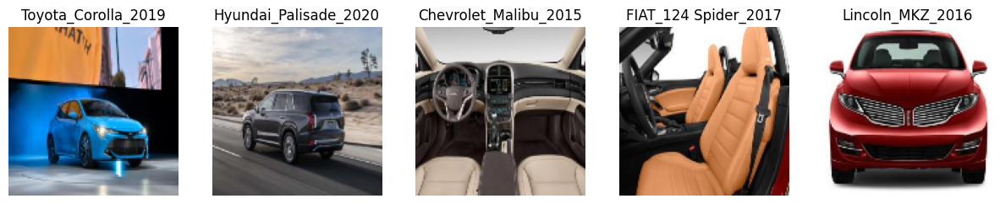

In [ ]:

# smaple image
fig, axes = plt.subplots(1, 5, figsize=(15, 15))
for i, ax in enumerate(axes):
  ax.imshow(train_df['image_data'][i])
  ax.set_title(train_df['label3'][i])
  ax.axis('off')
plt.show()

In [ ]:


print("Number of classes in label1:", len(train_df['label1'].unique()))
print("Number of classes in label2:", len(train_df['label2'].unique()))
print("Number of classes in label3:", len(train_df['label3'].unique()))


Number of classes in label1: 42
Number of classes in label2: 321
Number of classes in label3: 2056


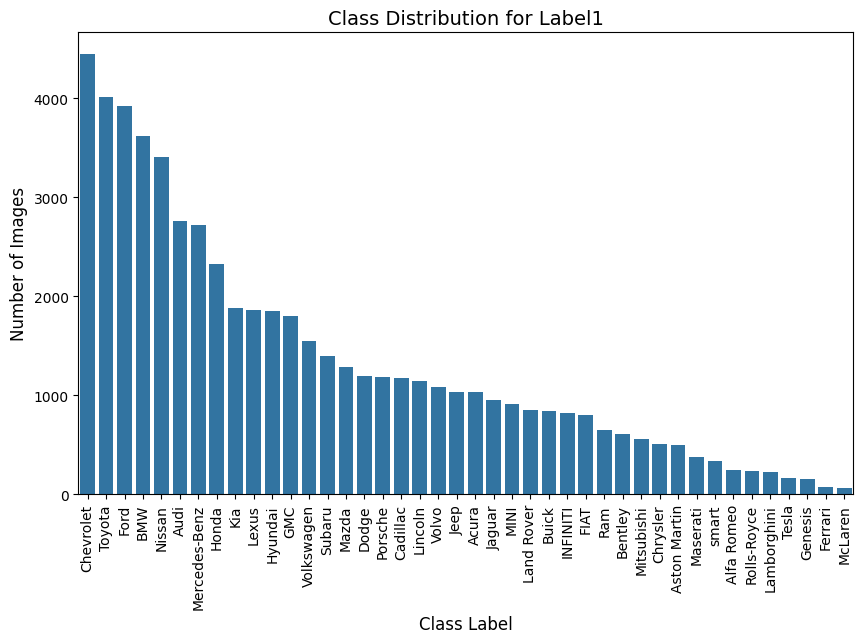

In [ ]:
import seaborn as sns

# Get the number of images for each class in label1
class_counts = train_df['label1'].value_counts()

# Create a bar plot to visualize the class distribution
plt.figure(figsize=(10, 6))
sns.barplot(x=class_counts.index, y=class_counts.values)
plt.xlabel('Class Label', fontsize=12)
plt.ylabel('Number of Images', fontsize=12)
plt.title('Class Distribution for Label1', fontsize=14)
plt.xticks(rotation=90)
plt.show()


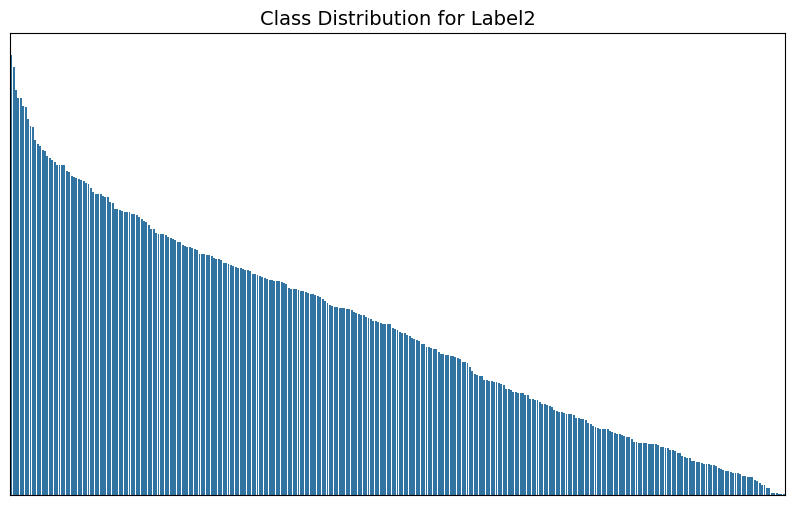

In [ ]:


# Get the number of images for each class in label2
class_counts = train_df['label2'].value_counts()

# Create a bar plot to visualize the class distribution
plt.figure(figsize=(10, 6))
sns.barplot(x=class_counts.index, y=class_counts.values)
plt.xlabel('')
plt.ylabel('')
plt.title('Class Distribution for Label2', fontsize=14)
plt.xticks([])
plt.yticks([])
plt.show()


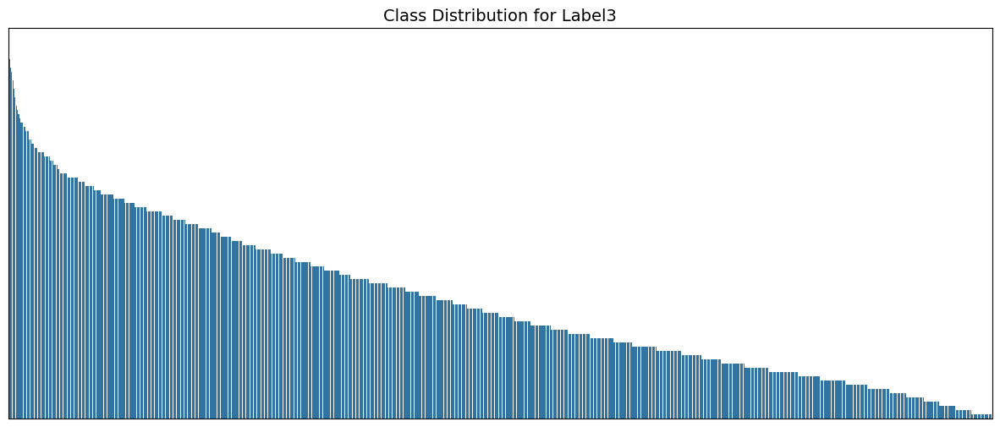

In [ ]:

# Get the number of images for each class in label3
class_counts = train_df['label3'].value_counts()

# Create a bar plot to visualize the class distribution
plt.figure(figsize=(15, 6))
sns.barplot(x=class_counts.index, y=class_counts.values)
plt.xlabel('')
plt.ylabel('')
plt.title('Class Distribution for Label3', fontsize=14)
plt.xticks([])
plt.yticks([])
plt.show()

In [ ]:
############## try to split, balance the data and then do augmentation transform

In [ ]:
import cv2
from torchvision import transforms
from PIL import Image

class CLAHETransform:
    """ Apply CLAHE to an image """
    def __init__(self, clip_limit=2.0, tile_grid_size=(8, 8)):
        self.clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)

    def __call__(self, img):
        img = np.array(img)
        if img.ndim == 3:
            img_yuv = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
            img_yuv[:,:,0] = self.clahe.apply(img_yuv[:,:,0])
            img = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)
        else:
            img = self.clahe.apply(img)
        return Image.fromarray(img)


In [ ]:


from torchvision import transforms

# Define a shared augmentation pipeline with RandomChoice to select one transformation randomly
shared_augmentation = transforms.Compose([
    CLAHETransform(),  # Apply CLAHE first
    transforms.RandomChoice([
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(90),
        transforms.RandomRotation(30),
        transforms.RandomResizedCrop(128, scale=(0.8, 1.0)),  # Random crop and zoom
        transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5)),  # Adding Gaussian Blur
        transforms.ColorJitter(brightness=0.1, contrast=0.1)
    ]),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalization
])


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.utils import resample

def split_and_resample_data(df, label_column, n_samples=3300, test_size=0.05, val_size=0.10):
    # Split off the test set from the initial dataset
    train_val_df, test_df = train_test_split(df, test_size=test_size, stratify=df[label_column], random_state=789)

    # Further split the remaining data into training and validation sets
    train_df, val_df = train_test_split(train_val_df, test_size=val_size/(1-test_size), stratify=train_val_df[label_column], random_state=456)

    # Resample training data to balance it
    balanced_dfs = []
    for label in train_df[label_column].unique():
        subset = train_df[train_df[label_column] == label]
        resampled_subset = resample(subset, replace=len(subset) < n_samples, n_samples=n_samples, random_state=123)
        balanced_dfs.append(resampled_subset)

    balanced_train_df = pd.concat(balanced_dfs).sample(frac=1).reset_index(drop=True)

    # No resampling for validation and test sets, they remain as they are
    return balanced_train_df, val_df, test_df




# split and balance
train_balanced_df, val_df, test_df = split_and_resample_data(train_df, 'label1_num')


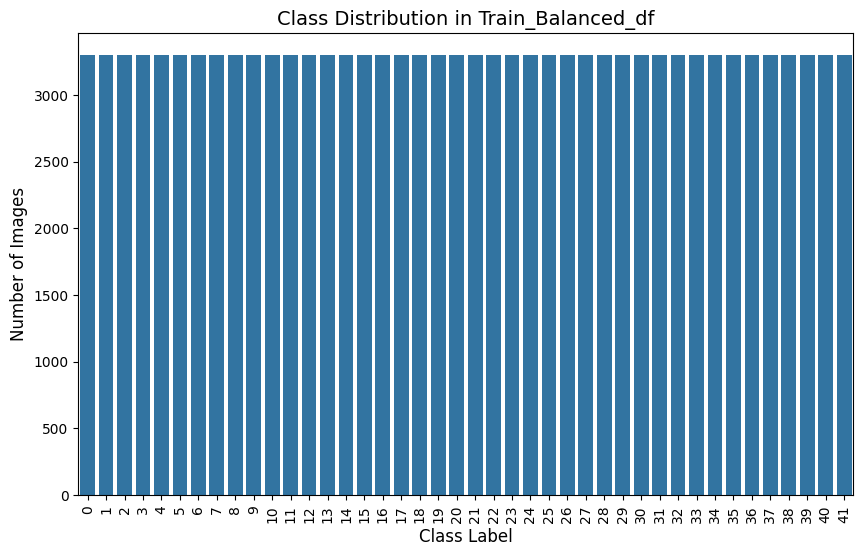

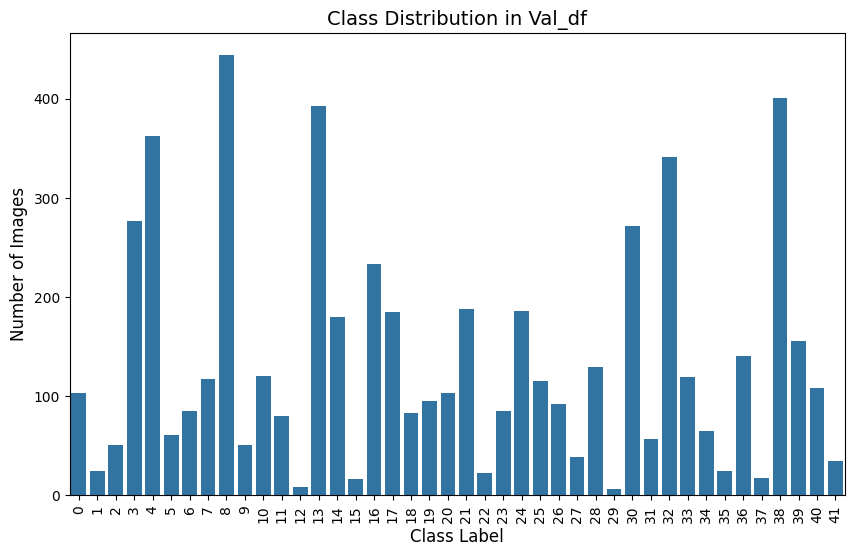

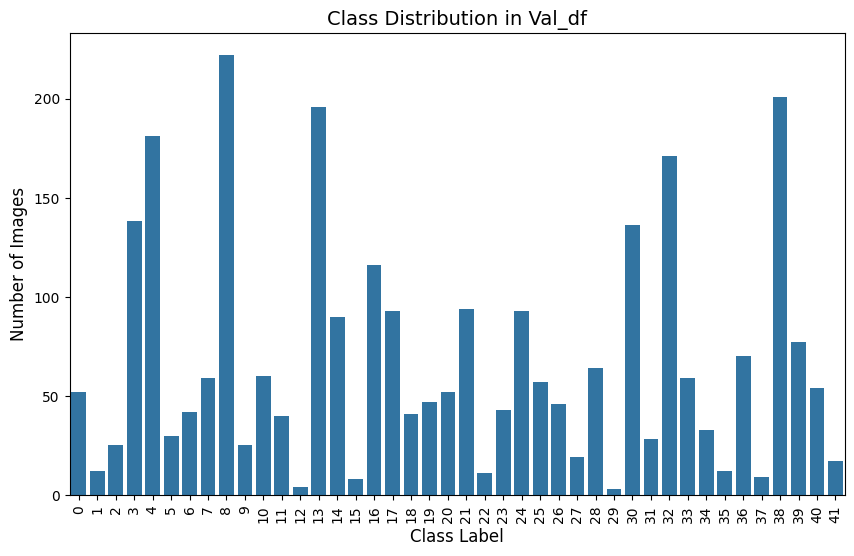

In [ ]:

# Distribution of classes in train_balanced_df
train_class_counts = train_balanced_df['label1_num'].value_counts()

# Create a bar plot to visualize the class distribution
plt.figure(figsize=(10, 6))
sns.barplot(x=train_class_counts.index, y=train_class_counts.values)
plt.xlabel('Class Label', fontsize=12)
plt.ylabel('Number of Images', fontsize=12)
plt.title('Class Distribution in Train_Balanced_df', fontsize=14)
plt.xticks(rotation=90)
plt.show()

# Distribution of classes in val_df
val_class_counts = val_df['label1_num'].value_counts()

# Create a bar plot to visualize the class distribution
plt.figure(figsize=(10, 6))
sns.barplot(x=val_class_counts.index, y=val_class_counts.values)
plt.xlabel('Class Label', fontsize=12)
plt.ylabel('Number of Images', fontsize=12)
plt.title('Class Distribution in Val_df', fontsize=14)
plt.xticks(rotation=90)
plt.show()


# Distribution of classes in val_df
val_class_counts = test_df['label1_num'].value_counts()

# Create a bar plot to visualize the class distribution
plt.figure(figsize=(10, 6))
sns.barplot(x=val_class_counts.index, y=val_class_counts.values)
plt.xlabel('Class Label', fontsize=12)
plt.ylabel('Number of Images', fontsize=12)
plt.title('Class Distribution in Val_df', fontsize=14)
plt.xticks(rotation=90)
plt.show()


In [ ]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

class CustomImageDataset(Dataset):
    def __init__(self, dataframe, transform=None, is_test=False):
        self.dataframe = dataframe
        self.is_test = is_test

        # Default transformation for test data
        if transform is None and is_test:
            self.transform = transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            ])
        else:
            self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_data = self.dataframe.iloc[idx]['image_data']
        img = Image.fromarray(img_data.astype('uint8'), 'RGB')

        # Apply the transformation
        img_transformed = self.transform(img) if self.transform else img

        if self.is_test:
            label = self.dataframe.iloc[idx]['label1_num']
            return img_transformed, label  # Return transformed image and label
        else:
            # For training/validation, simulate contrastive learning scenario
            xi = img_transformed
            xj = self.transform(img) if self.transform else img
            return xi, xj

# Create dataset objects with specific transformations
train_dataset = CustomImageDataset(train_balanced_df, transform=shared_augmentation)
val_dataset = CustomImageDataset(val_df, transform=shared_augmentation)

# Create DataLoaders for training and validation
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False, num_workers=0)

# Create dataset and DataLoader for test data
# Now uses default transformation if none is provided, suitable for model processing
test_dataset = CustomImageDataset(test_df, is_test=True)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=0)




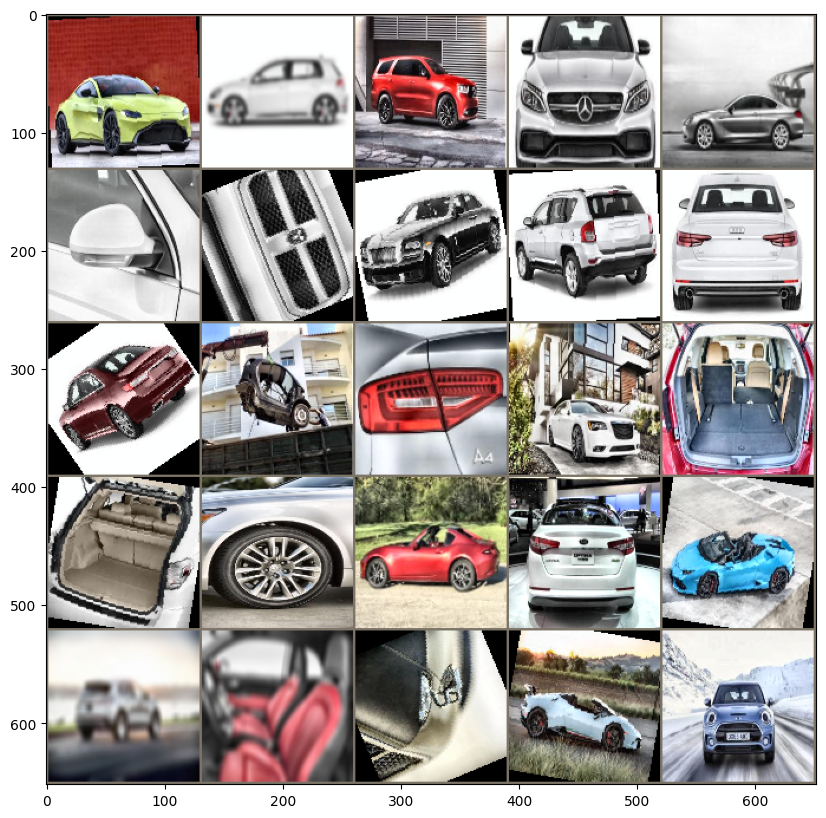

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from torchvision.utils import make_grid

def imshow(img, title=None):
    """Imshow for Tensor."""
    plt.figure(figsize=(15, 10))  # Set the figure size to 10x10 inches
    img = img.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = std * img + mean  # Reapply the mean and std
    img = np.clip(img, 0, 1)  # Ensure pixel values are within [0, 1]
    plt.imshow(img)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

# Get a batch of images from the DataLoader
dataiter = iter(train_loader)
images, labels = next(dataiter)

# Limit the images to only the first 25 for displaying 5 rows with 5 images each
max_images = 25
images_to_show = images[:max_images]

# Convert the limited batch to a grid of images
out = make_grid(images_to_show, nrow=5)

# Display the grid of images, applying the inverse of the normalization transform
imshow(out)




In [ ]:
# prompt: show the length of train_dataset

print(len(train_dataset))


138600


In [ ]:
###########

In [ ]:
import torch.nn as nn
from torchvision.models import resnet18, ResNet18_Weights

import torch
import torch.nn as nn
import torchvision.models as models


class ResNetSimCLR_new(nn.Module):
    def __init__(self, base_model, out_dim):
        super(ResNetSimCLR_new, self).__init__()
        # Utilize pretrained models
        self.resnet_dict = {
            "resnet18": models.resnet18(pretrained=True),
            "resnet50": models.resnet50(pretrained=True)
        }

        self.base_model = base_model
        self.backbone = self._get_basemodel(base_model)
        dim_mlp = self.backbone.fc.in_features

        # Replace the fully connected layer with an identity to use its output
        self.backbone.fc = nn.Identity()

        # Adding MLP projection head
        self.projection_head = nn.Sequential(
            nn.Linear(dim_mlp, dim_mlp),
            nn.ReLU(),
            nn.Linear(dim_mlp, dim_mlp),
            nn.ReLU(),
            nn.Linear(dim_mlp, dim_mlp),
            nn.ReLU(),
            nn.Linear(dim_mlp, out_dim),

        )
        # Freeze all the layers first
        for param in self.backbone.parameters():
            param.requires_grad = False


        # Unfreeze the layer 3
        for param in self.backbone.layer3.parameters():
            param.requires_grad = True

        # Unfreeze the top layers (layer4 and fc)
        for param in self.backbone.layer4.parameters():
            param.requires_grad = True

    def _get_basemodel(self, model_name):
        if model_name not in self.resnet_dict:
            raise ValueError("Invalid backbone architecture. Choose either 'resnet18' or 'resnet50'")
        return self.resnet_dict[model_name]

    def forward(self, x):
        # First, pass through the main backbone to get features
        features = self.backbone(x)

        # Then apply the projection head to these features
        out = self.projection_head(features)

        output = F.normalize(out, dim = 1)

        return output

In [ ]:
import torch
import torch.nn.functional as F

def info_nce_loss(features, temperature=0.5):
    """
    Computes the InfoNCE loss from the feature representations.
    """
    batch_size = features.shape[0] // 2
    labels = torch.cat([torch.arange(batch_size) for _ in range(2)], dim=0)
    labels = (labels.unsqueeze(0) == labels.unsqueeze(1)).float().to(features.device)

    features = F.normalize(features, dim=1)

    similarity_matrix = torch.matmul(features, features.T)

    # Ensure the mask is created with the correct size
    mask = torch.eye(similarity_matrix.size(0), dtype=torch.bool).to(features.device)
    labels = labels[~mask].view(labels.shape[0], -1)
    similarity_matrix = similarity_matrix[~mask].view(similarity_matrix.shape[0], -1)

    # Select the positives and negatives
    positives = similarity_matrix[labels.bool()].view(labels.shape[0], -1)
    negatives = similarity_matrix[~labels.bool()].view(similarity_matrix.shape[0], -1)

    # Prepare logits and labels for CrossEntropy loss
    logits = torch.cat([positives, negatives], dim=1)
    labels = torch.zeros(logits.shape[0], dtype=torch.long).to(features.device)

    logits = logits / temperature
    return F.cross_entropy(logits, labels)


In [ ]:
# Hyperparameters
epochs = 100  # Total number of epochs to train
learning_rate = 0.001  # Learning rate for the optimizer
temperature = 0.5  # Temperature used in softmax for contrastive learning
batch_size = 64  # Batch size for training

In [ ]:

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ResNetSimCLR_new(base_model='resnet50', out_dim=64).to(device)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 188MB/s]
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed i

In [ ]:


optimizer = optim.Adam(model.parameters(), lr= learning_rate)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=1, factor=0.5, verbose=True)

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


In [ ]:
def save_checkpoint(state, filename="checkpoint.pth.tar"):
    torch.save(state, filename)

In [ ]:
# Initialize the best validation loss to a high value
best_val_loss = float('inf')

# Function to evaluate model on validation data
def validate_model(model, data_loader, temperature, device):
    model.eval()
    total_loss = 0.0
    with torch.no_grad():
        for ((xi, xj)) in data_loader:
            images = torch.cat([xi, xj], dim=0).to(device)
            output = model(images)
            loss = info_nce_loss(output, temperature=temperature)
            total_loss += loss.item()
    avg_loss = total_loss / len(data_loader)
    return avg_loss

In [ ]:
# Setup TensorBoard writer
log_dir = "/content/drive/MyDrive/SCAN-CAR/train_log_10"
writer = SummaryWriter(log_dir)


In [ ]:


def train_one_epoch(model, data_loader, optimizer, temperature, epoch_index, writer, device):
    model.train()
    total_loss = 0.0
    for batch_index, ((xi, xj)) in enumerate(data_loader):
        images = torch.cat([xi, xj], dim=0).to(device)
        optimizer.zero_grad()

        # Get only the output from the projection head for loss calculation
        output = model(images)
        loss = info_nce_loss(output, temperature=temperature)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()


    avg_loss = total_loss / len(data_loader)
    #writer.add_scalar('Loss/average_train', avg_loss, epoch_index)
    return avg_loss










In [ ]:
# Training and validation loop
for epoch in range(epochs):
    avg_train_loss = train_one_epoch(model, train_loader, optimizer, temperature, epoch, writer, device)
    avg_val_loss = validate_model(model, val_loader, temperature, device)

    writer.add_scalar('Loss/average_train', avg_train_loss, epoch)
    writer.add_scalar('Loss/average_val', avg_val_loss, epoch)
    scheduler.step(avg_val_loss)

    print(f'Epoch {epoch + 1}, Training Loss: {avg_train_loss}, Validation Loss: {avg_val_loss}')

    # Save the model if it has the best validation loss so far
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        save_checkpoint({
            'epoch': epoch + 1,
            'state_dict': model.state_dict(),
            'optimizer': optimizer.state_dict()
        }, filename=os.path.join(log_dir, f'best_model_10.pth.tar'))
        print(f"New best model saved with validation loss {best_val_loss}")

writer.close()

Epoch 1, Training Loss: 4.078034986855288, Validation Loss: 3.8467810106277467
New best model saved with validation loss 3.8467810106277467
Epoch 2, Training Loss: 3.7626508173793978, Validation Loss: 3.711017441749573
New best model saved with validation loss 3.711017441749573
Epoch 3, Training Loss: 3.699961865589909, Validation Loss: 3.67519344329834
New best model saved with validation loss 3.67519344329834
Epoch 4, Training Loss: 3.6813015642314726, Validation Loss: 3.662792181968689
New best model saved with validation loss 3.662792181968689
Epoch 5, Training Loss: 3.668953352035274, Validation Loss: 3.67478271484375
Epoch 6, Training Loss: 3.662345894166498, Validation Loss: 3.646030921936035
New best model saved with validation loss 3.646030921936035
Epoch 7, Training Loss: 3.6553110848405206, Validation Loss: 3.642100524902344
New best model saved with validation loss 3.642100524902344
Epoch 8, Training Loss: 3.649427696260447, Validation Loss: 3.633363356590271
New best model

Exception in thread Thread-18:
Traceback (most recent call last):
  File "/usr/lib/python3.10/threading.py", line 1016, in _bootstrap_inner
    self.run()
  File "/usr/local/lib/python3.10/dist-packages/tensorboard/summary/writer/event_file_writer.py", line 244, in run
    self._run()
  File "/usr/local/lib/python3.10/dist-packages/tensorboard/summary/writer/event_file_writer.py", line 289, in _run
    self._record_writer.flush()
  File "/usr/local/lib/python3.10/dist-packages/tensorboard/summary/writer/record_writer.py", line 43, in flush
    self._writer.flush()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/lib/io/file_io.py", line 221, in flush
    self._writable_file.flush()
tensorflow.python.framework.errors_impl.FailedPreconditionError: /content/drive/MyDrive/SCAN-CAR/train_log_10/events.out.tfevents.1714439307.f47f2c390b60.331.4; Transport endpoint is not connected


FailedPreconditionError: /content/drive/MyDrive/SCAN-CAR/train_log_10/events.out.tfevents.1714439307.f47f2c390b60.331.4; Transport endpoint is not connected

In [ ]:
# Countinue train the best model

# Load checkpoint
checkpoint = torch.load(os.path.join(log_dir, 'best_model_8.pth.tar'))
model.load_state_dict(checkpoint['state_dict'])
optimizer.load_state_dict(checkpoint['optimizer'])

# Load the last epoch and best validation loss
start_epoch = checkpoint.get('epoch', 0)
best_val_loss = checkpoint.get('best_val_loss', float('inf'))

# Training loop starts from the next epoch
for epoch in range(start_epoch, 100):
    avg_train_loss = train_one_epoch(model, train_loader, optimizer, temperature, epoch, writer, device)
    avg_val_loss = validate_model(model, val_loader, temperature, device)

    writer.add_scalar('Loss/average_val', avg_val_loss, epoch)

    # Only step the scheduler if avg_val_loss is not None
    if avg_val_loss is not None:
        scheduler.step(avg_val_loss)

    print(f'Epoch {epoch + 1}, Training Loss: {avg_train_loss}, Validation Loss: {avg_val_loss}')

    # Save the model if it has the best validation loss so far
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        save_checkpoint({
            'epoch': epoch + 1,
            'state_dict': model.state_dict(),
            'optimizer': optimizer.state_dict(),
            'best_val_loss': best_val_loss
        }, filename=os.path.join(log_dir, f'best_model_8_2.pth.tar'))
        print(f"New best model saved with validation loss {best_val_loss}")

writer.close()


Epoch 24, Training Loss: 0.01565393623876723, Validation Loss: 0.018847595923580228
New best model saved with validation loss 0.018847595923580228
Epoch 25, Training Loss: 0.016999045365093998, Validation Loss: 0.01938466270454228
Epoch 26, Training Loss: 0.017439260674761238, Validation Loss: 0.019381766011938452
Epoch 27, Training Loss: 0.01638654565255492, Validation Loss: 0.019587641321122645
Epoch 28, Training Loss: 0.01715349432862097, Validation Loss: 0.01891717981779948


KeyboardInterrupt: 

### Challenges


Test run 1:

Tried without pre-trained weights on ResNet50 struct with one MLP projection layer.

Achieved good learning process with 10 epoch.

Test run 2:

Tried train with pre-trained weights on ImageNet on ResNet 50, unfreeze the top (layer4) of the ResNet.

Learning curve is not good and oscillating.

Test run 3:

Tried unfreeze the top 2 layers.
Result is good. We tried to train with 30 epochs and model learns with each epoch. that means we can further train the model in the future.

Future Work.

More epochs of train.

Set up validation dataset.




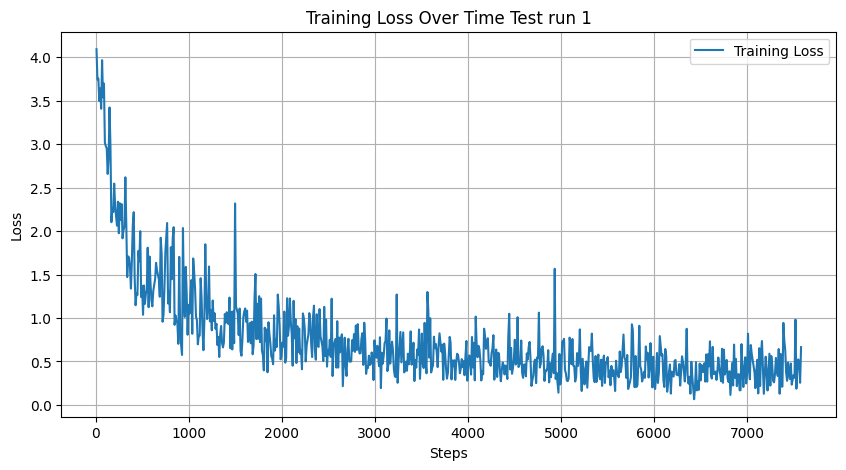

In [ ]:

from tensorboard.backend.event_processing import event_accumulator
import matplotlib.pyplot as plt

# Load the TensorBoard logs
ea = event_accumulator.EventAccumulator('/content/drive/MyDrive/SCAN-CAR/train_log')
ea.Reload()


if 'Loss/train' in ea.scalars.Keys():
    loss_values = ea.scalars.Items('Loss/train')
    steps = [x.step for x in loss_values]
    values = [x.value for x in loss_values]

    plt.figure(figsize=(10, 5))
    plt.plot(steps, values, label='Training Loss')
    plt.xlabel('Steps')
    plt.ylabel('Loss')
    plt.title('Training Loss Over Time Test run 1')
    plt.legend()
    plt.grid(True)
    plt.show()
else:
    print("No 'Loss/train' data found in logs.")

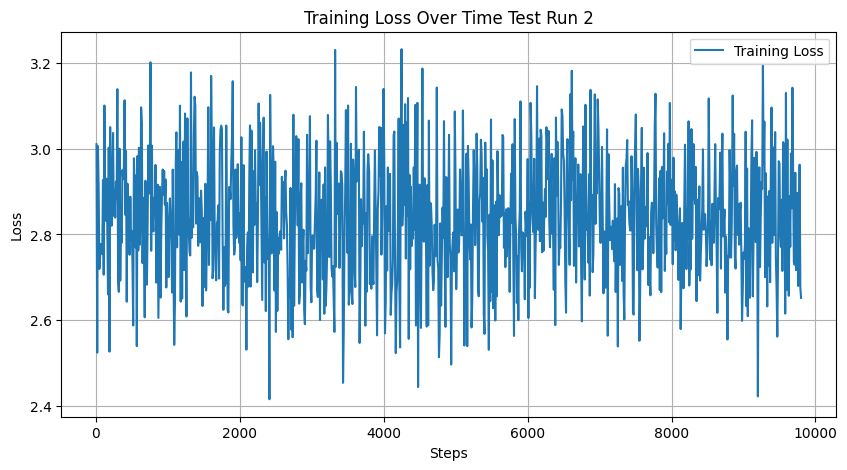

In [ ]:

from tensorboard.backend.event_processing import event_accumulator
import matplotlib.pyplot as plt

# Load the TensorBoard logs
ea = event_accumulator.EventAccumulator('/content/drive/MyDrive/SCAN-CAR/train_log_2')
ea.Reload()


if 'Loss/train' in ea.scalars.Keys():
    loss_values = ea.scalars.Items('Loss/train')
    steps = [x.step for x in loss_values]
    values = [x.value for x in loss_values]

    plt.figure(figsize=(10, 5))
    plt.plot(steps, values, label='Training Loss')
    plt.xlabel('Steps')
    plt.ylabel('Loss')
    plt.title('Training Loss Over Time Test Run 2')
    plt.legend()
    plt.grid(True)
    plt.show()
else:
    print("No 'Loss/train' data found in logs.")

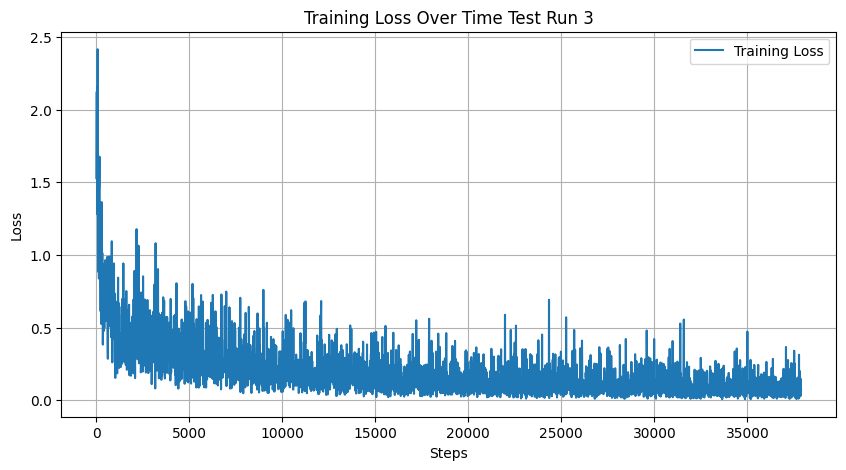

In [ ]:


from tensorboard.backend.event_processing import event_accumulator
import matplotlib.pyplot as plt

# Load the TensorBoard logs
ea = event_accumulator.EventAccumulator('/content/drive/MyDrive/SCAN-CAR/train_log_3')
ea.Reload()


if 'Loss/train' in ea.scalars.Keys():
    loss_values = ea.scalars.Items('Loss/train')
    steps = [x.step for x in loss_values]
    values = [x.value for x in loss_values]

    plt.figure(figsize=(10, 5))
    plt.plot(steps, values, label='Training Loss')
    plt.xlabel('Steps')
    plt.ylabel('Loss')
    plt.title('Training Loss Over Time Test Run 3')
    plt.legend()
    plt.grid(True)
    plt.show()
else:
    print("No 'Loss/train' data found in logs.")

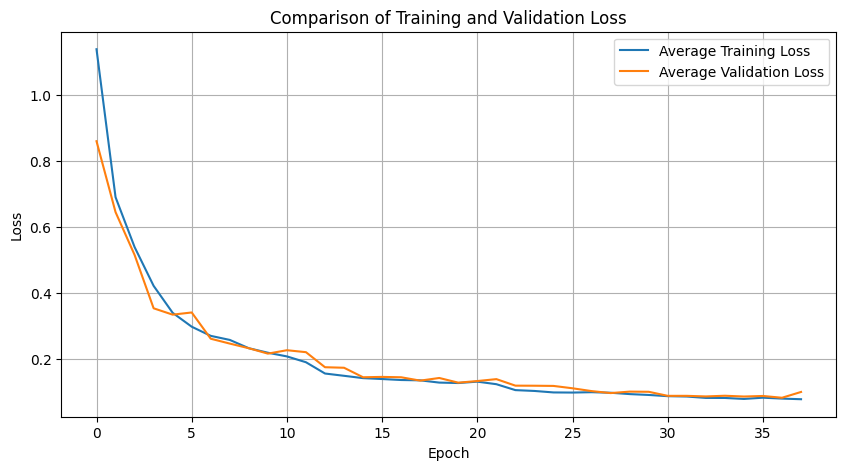

In [ ]:

# test run 4 with val dataset and larger batch size.


from tensorboard.backend.event_processing import event_accumulator
import matplotlib.pyplot as plt
import numpy as np

# Load the TensorBoard logs
log_path = '/content/drive/MyDrive/SCAN-CAR/train_log_4'  # Make sure this path matches where your logs are stored
ea = event_accumulator.EventAccumulator(log_path)
ea.Reload()

# Function to extract and average data from TensorBoard logs
def extract_and_average(ea, tag):
    if tag in ea.scalars.Keys():
        loss_events = ea.scalars.Items(tag)
        steps = [x.step for x in loss_events]
        values = [x.value for x in loss_events]
        epochs = max(steps) + 1
        epoch_values = np.zeros(epochs)
        epoch_counts = np.zeros(epochs)
        for step, value in zip(steps, values):
            epoch_values[step] += value
            epoch_counts[step] += 1
        averaged_values = epoch_values / epoch_counts
        return np.arange(epochs), averaged_values
    else:
        print(f"No data found for tag {tag}")
        return [], []

# Extract data
train_steps, train_avg_losses = extract_and_average(ea, 'Loss/average_train')
val_steps, val_avg_losses = extract_and_average(ea, 'Loss/average_val')

# Create the plot
plt.figure(figsize=(10, 5))
plt.plot(train_steps, train_avg_losses, label='Average Training Loss')
plt.plot(val_steps, val_avg_losses, label='Average Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Comparison of Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()


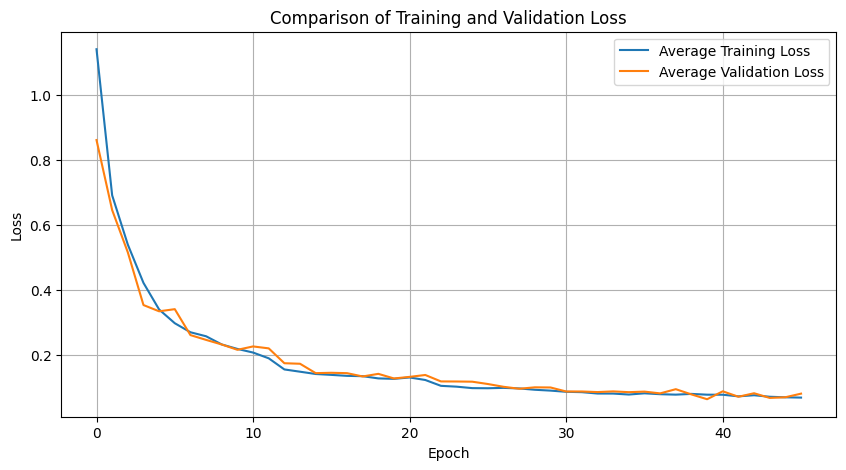

In [ ]:

# test run 4 with val dataset and larger batch size.


from tensorboard.backend.event_processing import event_accumulator
import matplotlib.pyplot as plt
import numpy as np

# Load the TensorBoard logs
log_path = '/content/drive/MyDrive/SCAN-CAR/train_log_4'  # Make sure this path matches where your logs are stored
ea = event_accumulator.EventAccumulator(log_path)
ea.Reload()

# Function to extract and average data from TensorBoard logs
def extract_and_average(ea, tag):
    if tag in ea.scalars.Keys():
        loss_events = ea.scalars.Items(tag)
        steps = [x.step for x in loss_events]
        values = [x.value for x in loss_events]
        epochs = max(steps) + 1
        epoch_values = np.zeros(epochs)
        epoch_counts = np.zeros(epochs)
        for step, value in zip(steps, values):
            epoch_values[step] += value
            epoch_counts[step] += 1
        averaged_values = epoch_values / epoch_counts
        return np.arange(epochs), averaged_values
    else:
        print(f"No data found for tag {tag}")
        return [], []

# Extract data
train_steps, train_avg_losses = extract_and_average(ea, 'Loss/average_train')
val_steps, val_avg_losses = extract_and_average(ea, 'Loss/average_val')

# Create the plot
plt.figure(figsize=(10, 5))
plt.plot(train_steps, train_avg_losses, label='Average Training Loss')
plt.plot(val_steps, val_avg_losses, label='Average Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Comparison of Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

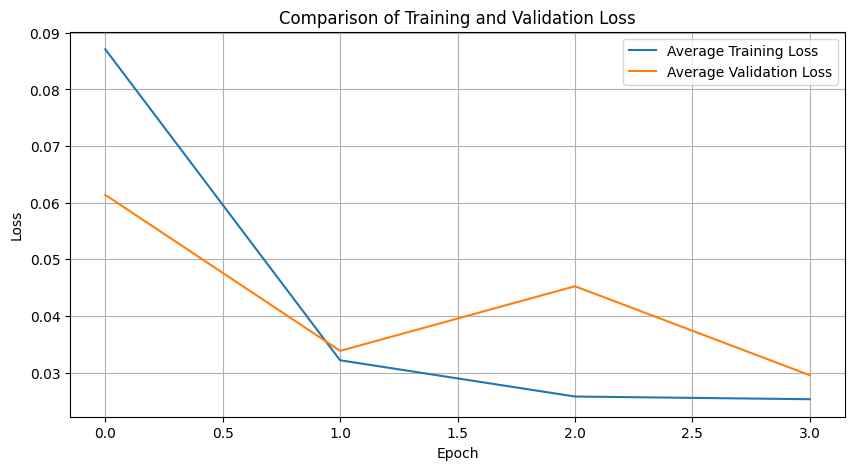

In [ ]:



from tensorboard.backend.event_processing import event_accumulator
import matplotlib.pyplot as plt
import numpy as np

# Load the TensorBoard logs
log_path = '/content/drive/MyDrive/SCAN-CAR/train_log_5'
ea = event_accumulator.EventAccumulator(log_path)
ea.Reload()

# Function to extract and average data from TensorBoard logs
def extract_and_average(ea, tag):
    if tag in ea.scalars.Keys():
        loss_events = ea.scalars.Items(tag)
        steps = [x.step for x in loss_events]
        values = [x.value for x in loss_events]
        epochs = max(steps) + 1
        epoch_values = np.zeros(epochs)
        epoch_counts = np.zeros(epochs)
        for step, value in zip(steps, values):
            epoch_values[step] += value
            epoch_counts[step] += 1
        averaged_values = epoch_values / epoch_counts
        return np.arange(epochs), averaged_values
    else:
        print(f"No data found for tag {tag}")
        return [], []

# Extract data
train_steps, train_avg_losses = extract_and_average(ea, 'Loss/average_train')
val_steps, val_avg_losses = extract_and_average(ea, 'Loss/average_val')

# Create the plot
plt.figure(figsize=(10, 5))
plt.plot(train_steps, train_avg_losses, label='Average Training Loss')
plt.plot(val_steps, val_avg_losses, label='Average Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Comparison of Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

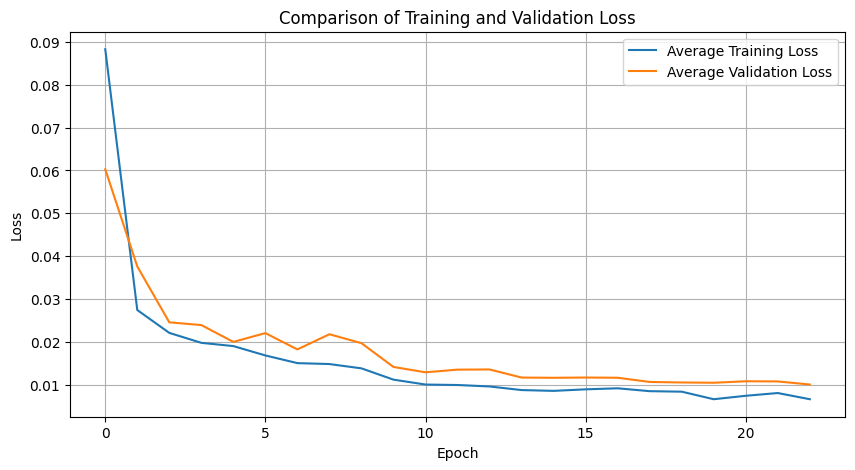

In [ ]:



from tensorboard.backend.event_processing import event_accumulator
import matplotlib.pyplot as plt
import numpy as np

# Load the TensorBoard logs
log_path = '/content/drive/MyDrive/SCAN-CAR/train_log_8'
ea = event_accumulator.EventAccumulator(log_path)
ea.Reload()

# Function to extract and average data from TensorBoard logs
def extract_and_average(ea, tag):
    if tag in ea.scalars.Keys():
        loss_events = ea.scalars.Items(tag)
        steps = [x.step for x in loss_events]
        values = [x.value for x in loss_events]
        epochs = max(steps) + 1
        epoch_values = np.zeros(epochs)
        epoch_counts = np.zeros(epochs)
        for step, value in zip(steps, values):
            epoch_values[step] += value
            epoch_counts[step] += 1
        averaged_values = epoch_values / epoch_counts
        return np.arange(epochs), averaged_values
    else:
        print(f"No data found for tag {tag}")
        return [], []

# Extract data
train_steps, train_avg_losses = extract_and_average(ea, 'Loss/average_train')
val_steps, val_avg_losses = extract_and_average(ea, 'Loss/average_val')

# Create the plot
plt.figure(figsize=(10, 5))
plt.plot(train_steps, train_avg_losses, label='Average Training Loss')
plt.plot(val_steps, val_avg_losses, label='Average Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Comparison of Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

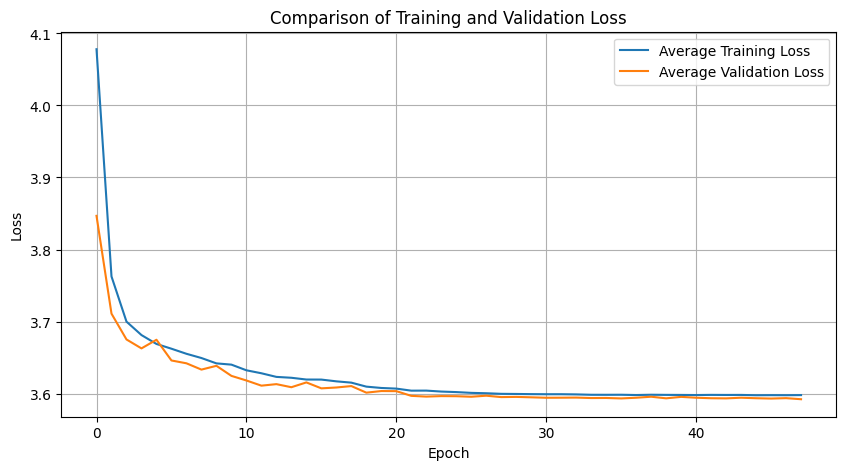

In [ ]:
# latest run for SIMCLR


from tensorboard.backend.event_processing import event_accumulator
import matplotlib.pyplot as plt
import numpy as np

# Load the TensorBoard logs
log_path = '/content/drive/MyDrive/SCAN-CAR/train_log_10'
ea = event_accumulator.EventAccumulator(log_path)
ea.Reload()

# Function to extract and average data from TensorBoard logs
def extract_and_average(ea, tag):
    if tag in ea.scalars.Keys():
        loss_events = ea.scalars.Items(tag)
        steps = [x.step for x in loss_events]
        values = [x.value for x in loss_events]
        epochs = max(steps) + 1
        epoch_values = np.zeros(epochs)
        epoch_counts = np.zeros(epochs)
        for step, value in zip(steps, values):
            epoch_values[step] += value
            epoch_counts[step] += 1
        averaged_values = epoch_values / epoch_counts
        return np.arange(epochs), averaged_values
    else:
        print(f"No data found for tag {tag}")
        return [], []

# Extract data
train_steps, train_avg_losses = extract_and_average(ea, 'Loss/average_train')
val_steps, val_avg_losses = extract_and_average(ea, 'Loss/average_val')

# Create the plot
plt.figure(figsize=(10, 5))
plt.plot(train_steps, train_avg_losses, label='Average Training Loss')
plt.plot(val_steps, val_avg_losses, label='Average Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Comparison of Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Step 1 completed, embedding model trained.
# Evaluate the model

In [ ]:
# Load Model

def load_model(model_path, model):
    checkpoint = torch.load(model_path, map_location=device)
    model.load_state_dict(checkpoint['state_dict'])
    return model


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model_path = '/content/drive/MyDrive/SCAN-CAR/train_log_10/best_model_10.pth.tar'

model = ResNetSimCLR_new(base_model='resnet50', out_dim=64).to(device)
model = load_model(model_path, model)
model.eval()

ResNetSimCLR_new(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(


In [ ]:
def extract_embeddings_and_labels(dataloader, model):
    model.eval()  # Set the model to evaluation mode
    embeddings = []
    labels = []
    with torch.no_grad():  # Turn off gradients for validation, saves memory and computations
        for x, y in dataloader:
            x = x.to(device)
            emb = model(x)
            embeddings.append(emb.cpu())  # Store embeddings
            labels.append(y)  # y should already be a tensor from the dataset

    embeddings = torch.cat(embeddings)  # Concatenate all embeddings
    labels = torch.cat(labels)  # Concatenate all labels
    return embeddings, labels




In [ ]:
test_embeddings, test_labels = extract_embeddings_and_labels(test_loader, model)


In [ ]:
# Perform Kmeans clustering using k = 42 (number of brands)

from sklearn.cluster import KMeans


kmeans = KMeans(n_clusters=42, random_state=42)
cluster_labels = kmeans.fit_predict(test_embeddings)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


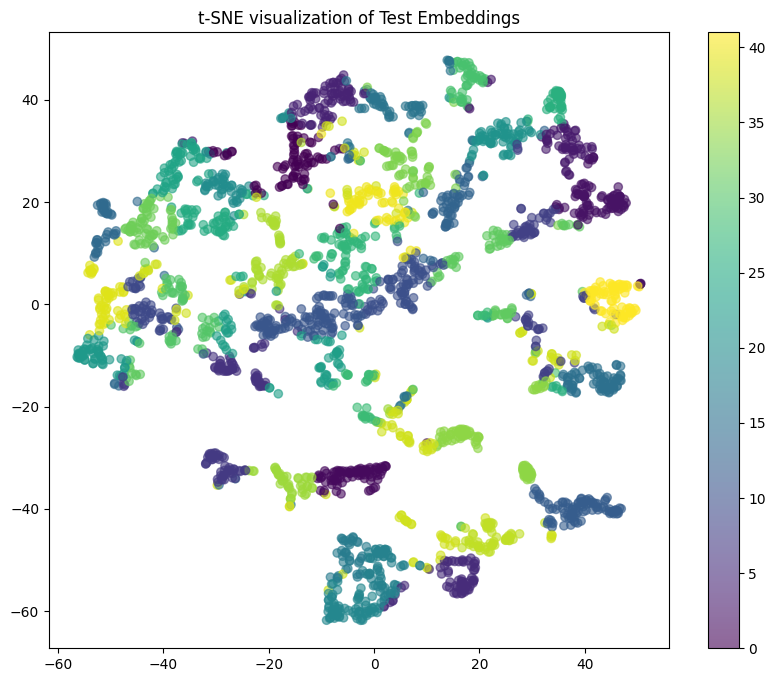

In [ ]:
# visualize the result using t-sne
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(test_embeddings)

# Plot t-SNE
plt.figure(figsize=(10, 8))
scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=cluster_labels, cmap='viridis', alpha=0.6)
plt.colorbar(scatter)
plt.title('t-SNE visualization of Test Embeddings')
plt.show()


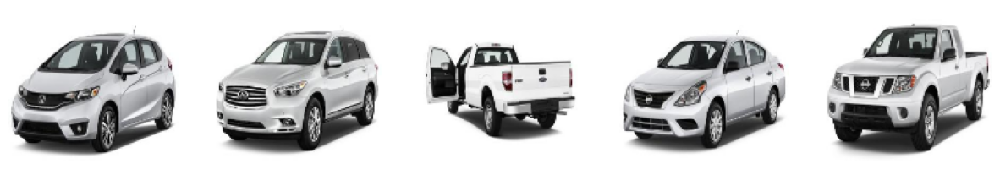

In [ ]:
# display few examples in a cluster

def display_images_from_cluster(dataframe, cluster_labels, cluster_number=5, num_images=5):
    cluster_indices = [i for i, label in enumerate(cluster_labels) if label == cluster_number]
    selected_indices = cluster_indices[:num_images]
    fig, axs = plt.subplots(1, num_images, figsize=(15, 3))
    for i, idx in enumerate(selected_indices):
        img_data = np.array(dataframe.iloc[idx]['image_data'])
        img = Image.fromarray(img_data)
        axs[i].imshow(img)
        axs[i].axis('off')
    plt.show()

display_images_from_cluster(test_df, cluster_labels, cluster_number=5, num_images=5)


Sample Image for Cluster 0:


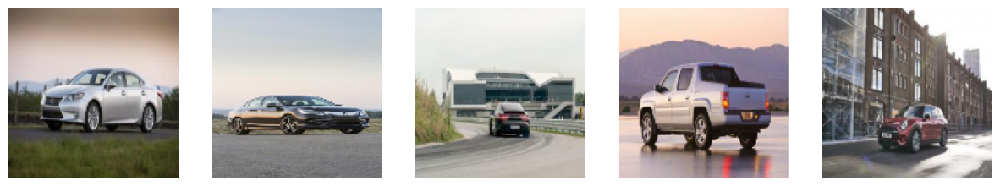

Sample Image for Cluster 1:


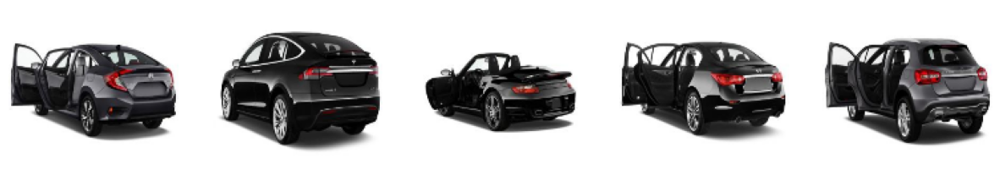

Sample Image for Cluster 2:


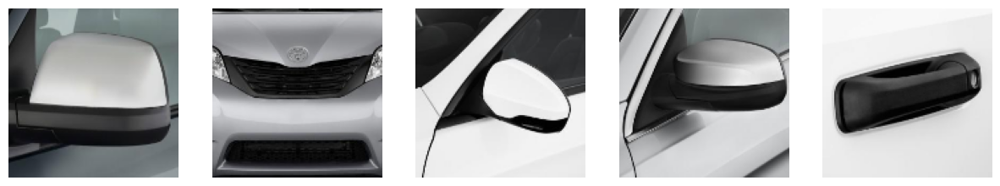

Sample Image for Cluster 3:


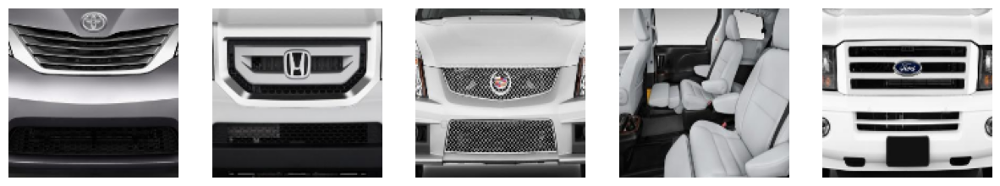

Sample Image for Cluster 4:


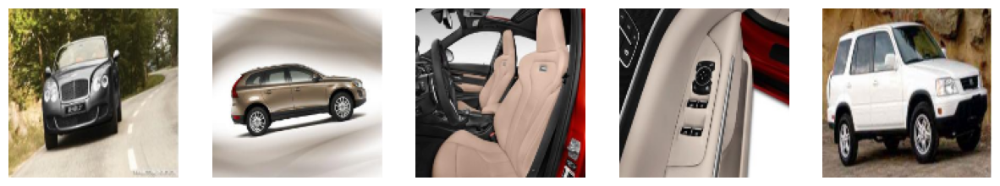

Sample Image for Cluster 5:


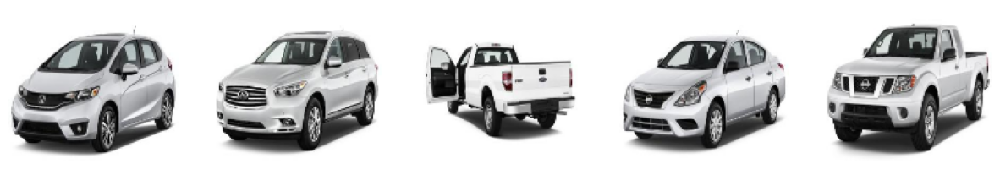

Sample Image for Cluster 6:


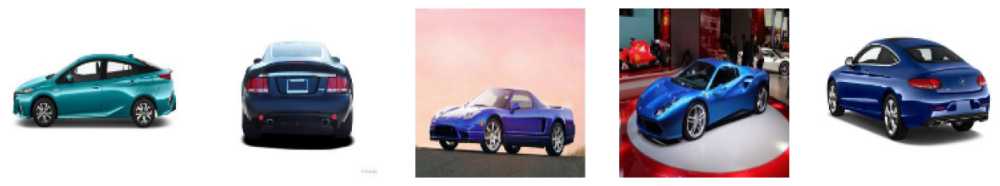

Sample Image for Cluster 7:


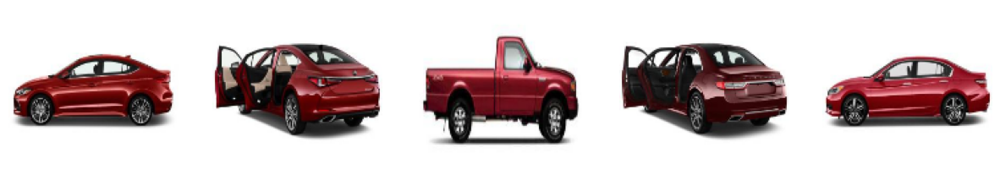

Sample Image for Cluster 8:


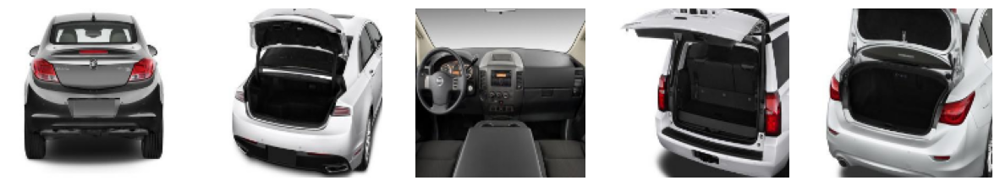

Sample Image for Cluster 9:


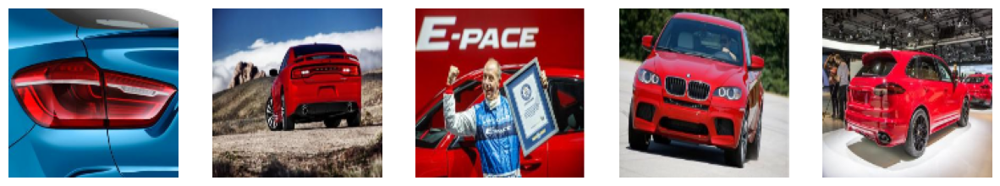

Sample Image for Cluster 10:


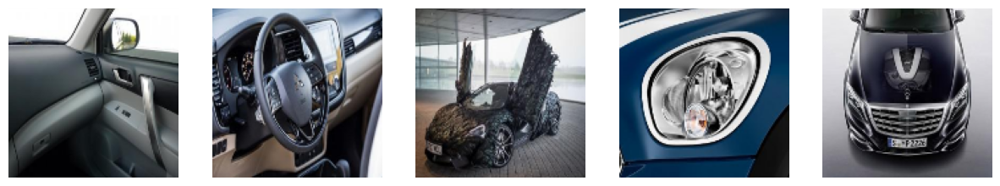

Sample Image for Cluster 11:


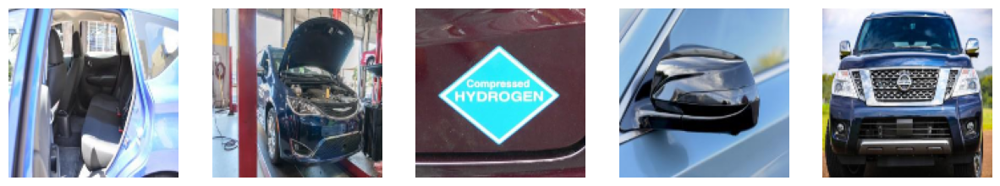

Sample Image for Cluster 12:


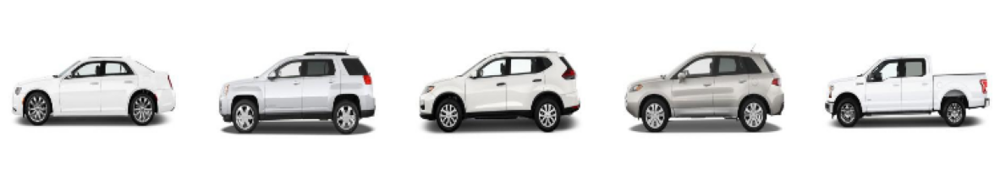

Sample Image for Cluster 13:


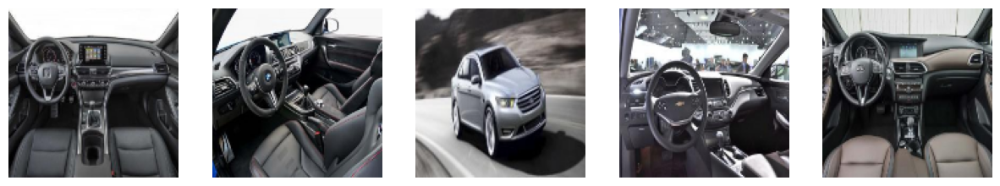

Sample Image for Cluster 14:


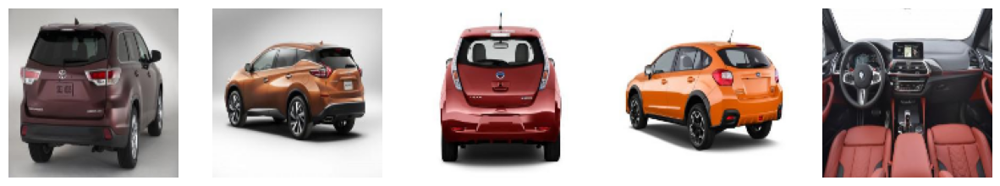

Sample Image for Cluster 15:


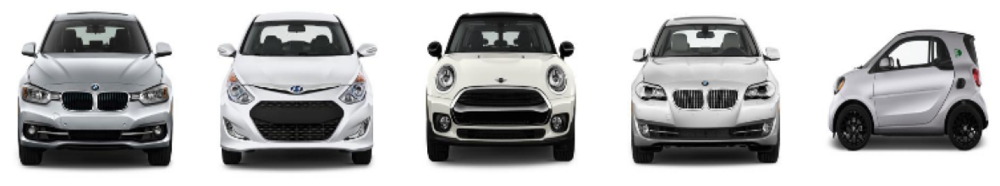

Sample Image for Cluster 16:


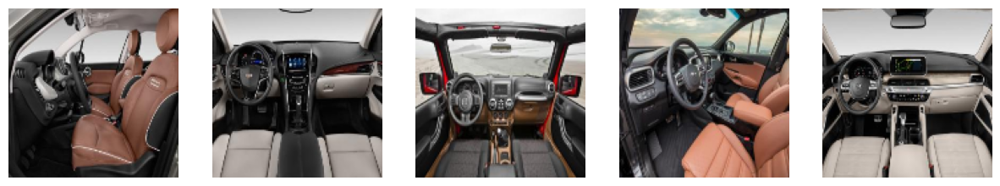

Sample Image for Cluster 17:


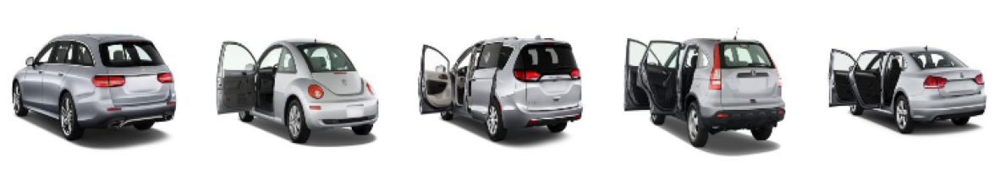

Sample Image for Cluster 18:


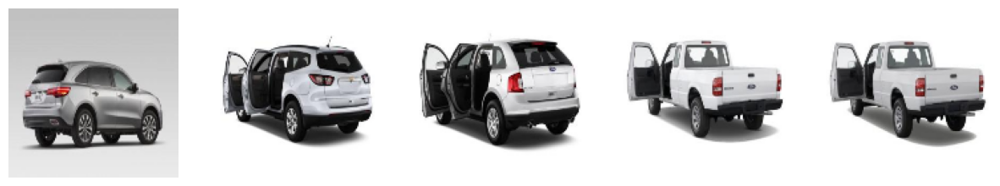

Sample Image for Cluster 19:


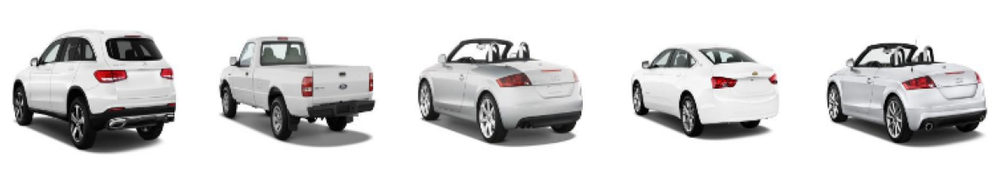

Sample Image for Cluster 20:


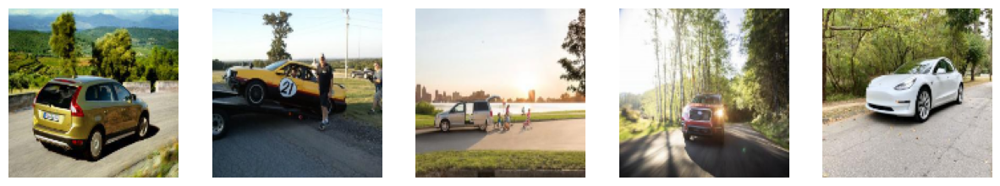

Sample Image for Cluster 21:


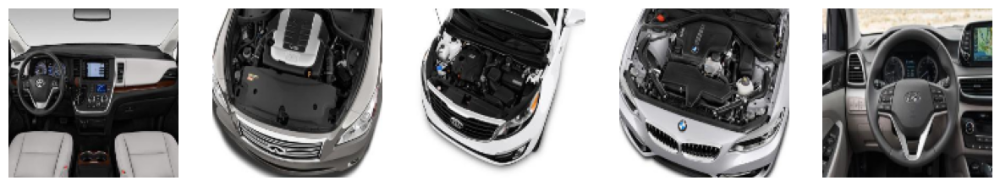

Sample Image for Cluster 22:


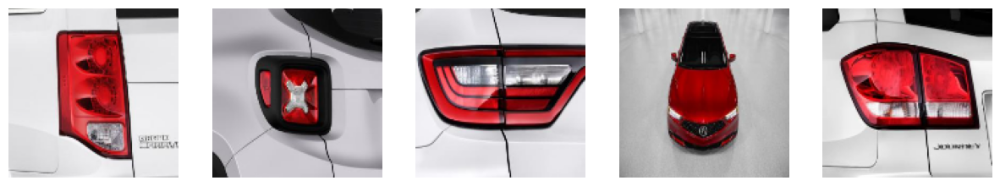

Sample Image for Cluster 23:


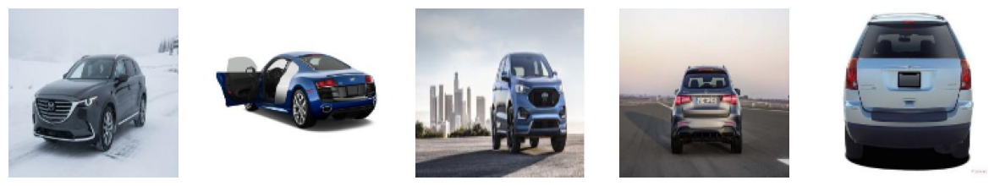

Sample Image for Cluster 24:


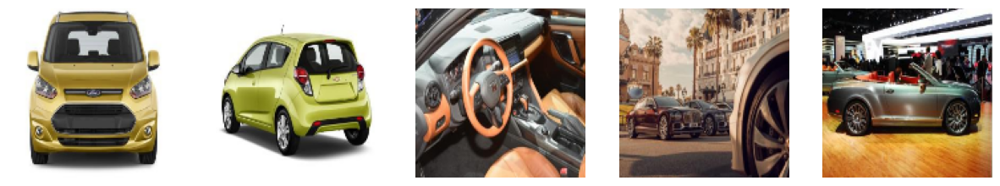

Sample Image for Cluster 25:


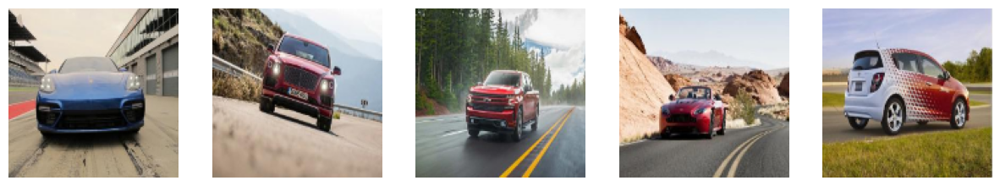

Sample Image for Cluster 26:


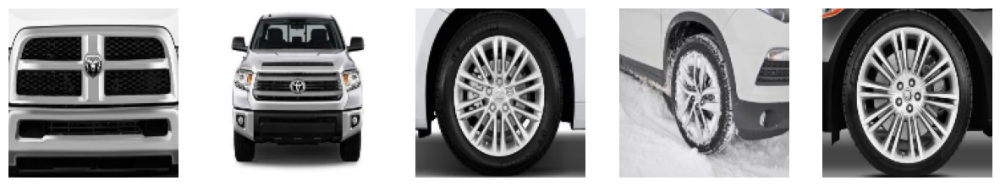

Sample Image for Cluster 27:


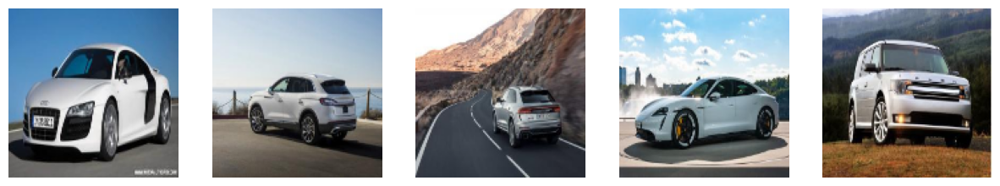

Sample Image for Cluster 28:


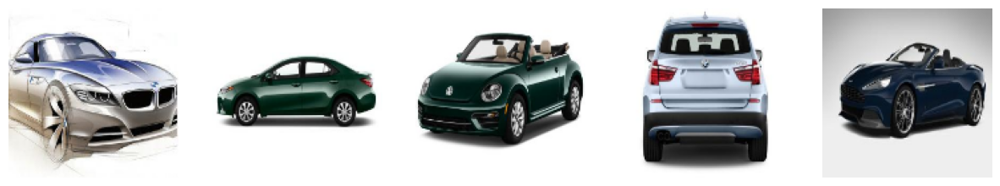

Sample Image for Cluster 29:


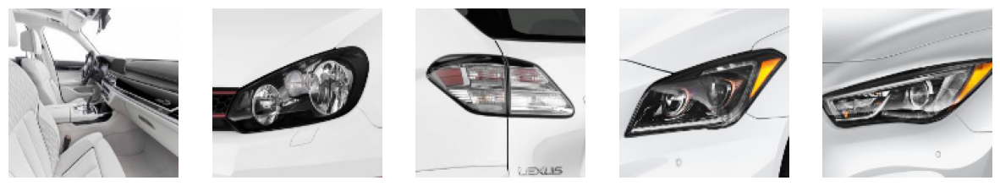

Sample Image for Cluster 30:


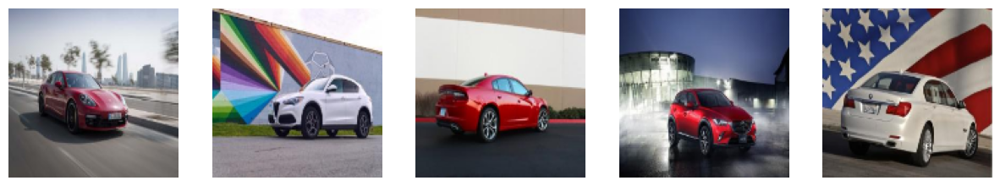

Sample Image for Cluster 31:


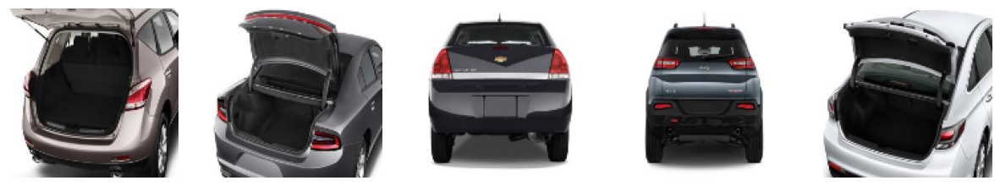

Sample Image for Cluster 32:


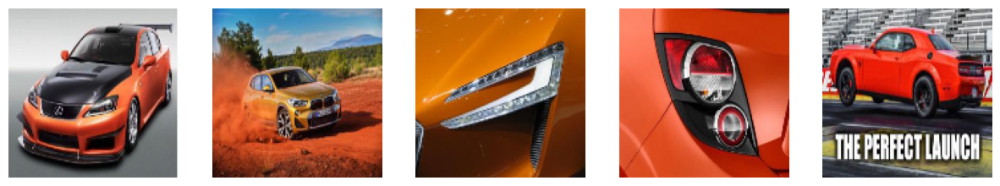

Sample Image for Cluster 33:


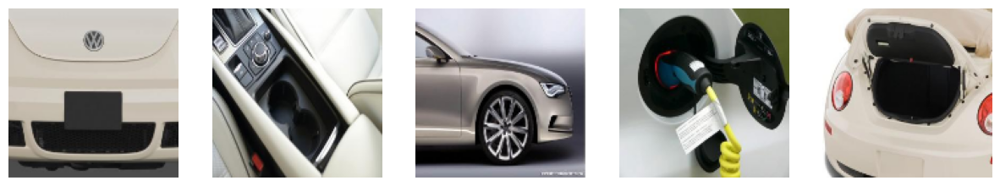

Sample Image for Cluster 34:


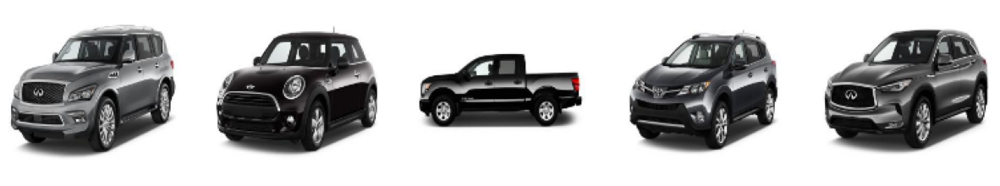

Sample Image for Cluster 35:


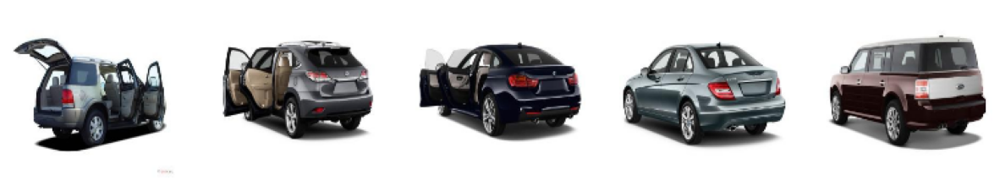

Sample Image for Cluster 36:


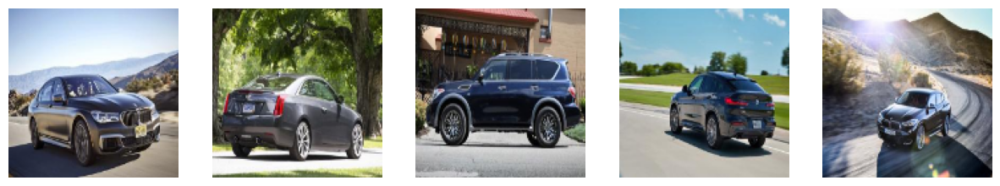

Sample Image for Cluster 37:


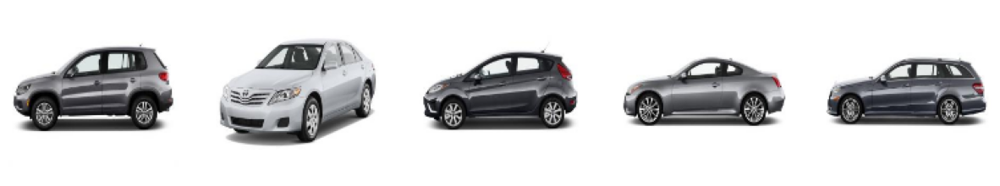

Sample Image for Cluster 38:


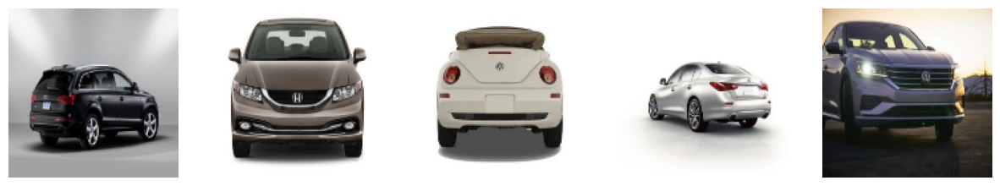

Sample Image for Cluster 39:


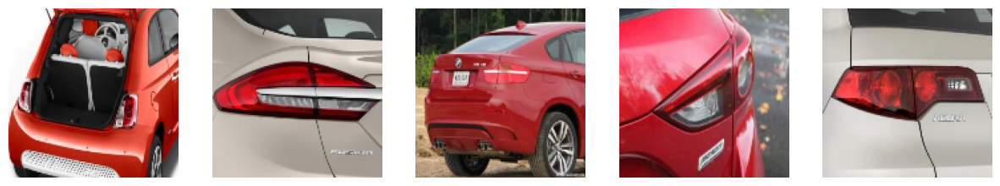

Sample Image for Cluster 40:


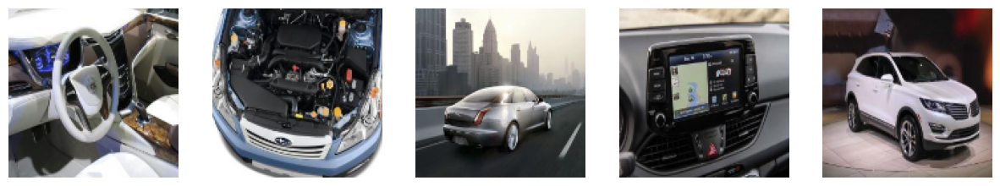

Sample Image for Cluster 41:


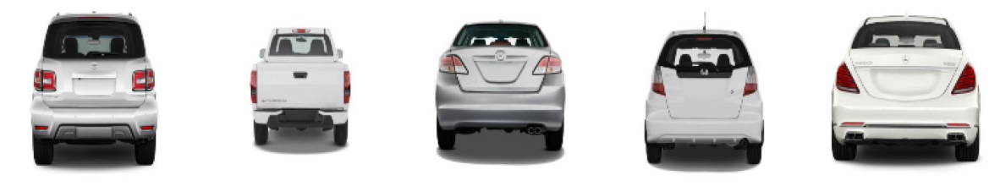

In [ ]:

for i in range(42):
    print(f"Sample Image for Cluster {i}:")
    display_images_from_cluster(test_df, cluster_labels, cluster_number=i, num_images=5)


In [ ]:
# print out the top-3 ground thruth class in each cluster and their percentage

import pandas as pd

# Append cluster labels to the DataFrame
test_df['cluster'] = cluster_labels

# Group by cluster and label, then count occurrences
cluster_label_counts = test_df.groupby(['cluster', 'label1']).size().reset_index(name='count')

# Calculate the total counts per cluster to normalize counts into percentages
total_counts_per_cluster = cluster_label_counts.groupby('cluster')['count'].transform('sum')
cluster_label_counts['percentage'] = (cluster_label_counts['count'] / total_counts_per_cluster) * 100

# Sort by percentage and take the top 3 for each cluster
top_classes_per_cluster = cluster_label_counts.sort_values(by=['cluster', 'percentage'], ascending=False).groupby('cluster').head(3)

# Display the results
print(top_classes_per_cluster)


      cluster         label1  count  percentage
1033       41      Chevrolet      9   12.000000
1052       41         Toyota      9   12.000000
1037       41           Ford      8   10.666667
1019       40  Mercedes-Benz      6   10.000000
1007       40       Cadillac      5    8.333333
...       ...            ...    ...         ...
30          1      Chevrolet      8    9.876543
34          1            GMC      8    9.876543
18          0  Mercedes-Benz      8    9.756098
1           0           Audi      7    8.536585
8           0          Honda      6    7.317073

[126 rows x 4 columns]


In [ ]:


# Create a DataFrame from cluster labels and test labels
df_clusters = pd.DataFrame({
    'Cluster': cluster_labels,
    'Label': test_labels.numpy()
})


In [ ]:
df_clusters.head()

,Cluster,Label
0,7,17
1,24,13
2,8,6
3,5,16
4,11,32


In [ ]:
# Calculate label distribution within each cluster
cluster_distribution = df_clusters.groupby(['Cluster', 'Label']).size().unstack(fill_value=0)

# Normalize the distribution to get percentages
cluster_percentages = cluster_distribution.div(cluster_distribution.sum(axis=1), axis=0)


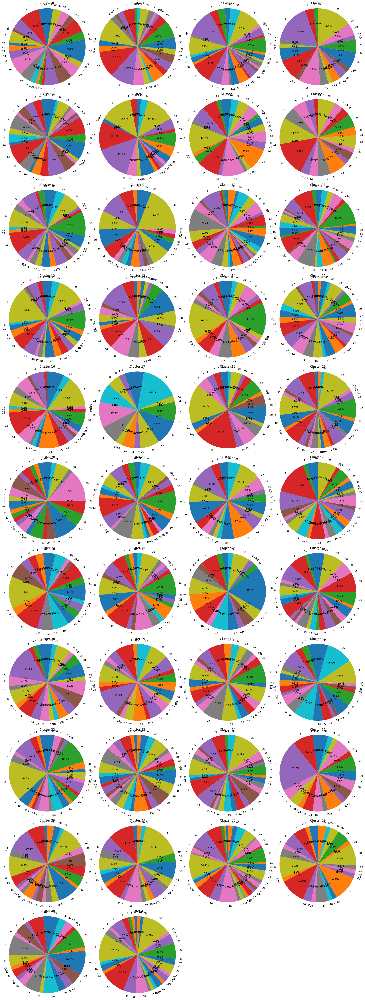

In [ ]:
import matplotlib.pyplot as plt

# Define the number of rows and columns for subplot grid
n_rows = (cluster_percentages.shape[0] + 3) // 4  # Ensure there's enough rows
n_cols = 4

# Create a figure with subplots
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, 5 * n_rows))
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Plot pie charts
for i, (idx, row) in enumerate(cluster_percentages.iterrows()):
    ax = axes[i]
    ax.pie(row, labels=row.index, autopct='%1.1f%%', startangle=90)
    ax.set_title(f'Cluster {idx}')
    ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Hide any unused axes
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score


true_labels = test_labels.numpy()  # Convert to numpy array if not already

# Calculate NMI and ARI
nmi_score = normalized_mutual_info_score(true_labels, cluster_labels)
ari_score = adjusted_rand_score(true_labels, cluster_labels)

print(f"Normalized Mutual Information (NMI): {nmi_score:.3f}")
print(f"Adjusted Rand Index (ARI): {ari_score:.3f}")


Normalized Mutual Information (NMI): 0.111
Adjusted Rand Index (ARI): 0.004


Interpretation

NMI: A higher NMI indicates a greater degree of agreement between the true labels and the clustering (with respect to the information each provides about the other). An NMI close to 1 suggests a very good clustering performance relative to the ground truth.


ARI: A higher ARI indicates that the clusters found by your algorithm largely agree with the true clusters. An ARI of 1 suggests the clustering is a perfect match to the true labels, and an ARI close to 0 or negative values suggest little to no agreement (with zero implying random assignments).

As for our SimCLR model with Brand Lables, both metrics are low

In [ ]:
from sklearn.metrics import silhouette_score


silhouette_avg = silhouette_score(test_embeddings, cluster_labels)
print(f"Silhouette Coefficient: {silhouette_avg:.3f}")


Silhouette Coefficient: 0.240


silhouette score using scikit-learn, which gives a measure from -1 (incorrect clustering) to +1 (highly dense clustering), with scores around zero indicating overlapping clusters.

In our case, we are around overlapping clustering, and it can be due to our cluster number are set to 42 (brand number).



From the visualization, we can see that each cluster consist of different label 1 (Car brand), However, upon chekcing into some sample images in the cluster, they are indeed shared some semantic similarities.

For example, the interiror or trunk images are succesfully grouped into the same cluster. Thus it somehow implies that the model learns to cluster really high-level similar images, and low-level differences like brand designs are hard to learn for a simCLR model.

We did not convert the images into grey scale because we think color is important in turns of "similar" for cars.

Now we want to see if SCAN loss can improve the model performance.

In [ ]:
def extract_features(model, data_loader):
    model.eval()
    features = []
    with torch.no_grad():
        for x, _ in data_loader:
            x = x.to(device)
            feature = model(x)
            features.append(feature)

    features = torch.cat(features, dim=0)
    return features

In [ ]:
train_features = extract_features(model, train_loader)

In [ ]:
val_features = extract_features(model, val_loader)

In [ ]:
from sklearn.neighbors import NearestNeighbors

def compute_neighbor_indices(features, n_neighbors=5):
    # Ensure features are in CPU memory and convert to numpy
    features_cpu = features.cpu().numpy()

    # Using cosine similarity to find nearest neighbors
    knn = NearestNeighbors(n_neighbors=n_neighbors, metric='cosine', algorithm='auto')
    knn.fit(features_cpu)
    distances, indices = knn.kneighbors(features_cpu)

    return indices

# Make sure to move the tensor to CPU before passing to the function if not done already
train_features_cpu = train_features.cpu()  # Move the tensor to CPU
train_neighbor_indices = compute_neighbor_indices(train_features_cpu, n_neighbors=5)




In [ ]:
val_features_cpu = val_features.cpu()  # Move the tensor to CPU
val_neighbor_indices = compute_neighbor_indices(val_features_cpu, n_neighbors=5)

In [ ]:
from torch.utils.data import Dataset
from PIL import Image
import numpy as np
import torch

class NeighborsDataset(Dataset):
    def __init__(self, dataframe, transform=None, neighbor_indices=None):
        """
        Initializes the dataset with a dataframe, a transform, and precomputed neighbor indices.

        Args:
        - dataframe (pd.DataFrame): The dataframe containing the image data and labels.
        - transform (callable, optional): Optional transform to be applied on a sample.
        - neighbor_indices (np.array): An array of indices indicating nearest neighbors for each image.
        """
        self.dataframe = dataframe
        self.transform = transform
        self.neighbor_indices = neighbor_indices

    def __len__(self):
        """Returns the total number of samples in the dataset."""
        return len(self.dataframe)

    def __getitem__(self, idx):
        """
        Fetches the anchor image and one of its neighbors by index.

        Args:
        - idx (int): Index of the anchor image.

        Returns:
        - dict: Dictionary containing the anchor image, neighbor image, and possibly other information.
        """
        # Load and transform the anchor image
        anchor_img_data = self.dataframe.iloc[idx]['image_data']
        anchor_img = Image.fromarray(anchor_img_data.astype('uint8'), 'RGB')
        if self.transform:
            anchor_img = self.transform(anchor_img)

        # Randomly select one neighbor
        neighbor_idx = np.random.choice(self.neighbor_indices[idx])
        neighbor_img_data = self.dataframe.iloc[neighbor_idx]['image_data']
        neighbor_img = Image.fromarray(neighbor_img_data.astype('uint8'), 'RGB')
        if self.transform:
            neighbor_img = self.transform(neighbor_img)

        return {
            'anchor': anchor_img,
            'neighbor': neighbor_img,
            'index': idx,
            'neighbor_index': neighbor_idx
        }

In [ ]:

from torchvision import transforms

# Shared transformation for both anchor and neighbor
shared_augmentation = transforms.Compose([
    #transforms.Resize((128, 128)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Initialize NeighborsDataset for training
train_dataset = NeighborsDataset(
    dataframe=train_balanced_df,
    transform=shared_augmentation,
    neighbor_indices=train_neighbor_indices
)

# DataLoader for training
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=0)

# For validation, if using neighbor data
val_dataset = NeighborsDataset(
    dataframe=val_df,
    transform=shared_augmentation,
    neighbor_indices=val_neighbor_indices
)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False, num_workers=0)


In [ ]:
class ResNetSCAN(nn.Module):
    def __init__(self, pretrained_model, num_clusters):
        super(ResNetSCAN, self).__init__()
        # Utilize the pretrained backbone from SimCLR, excluding its projection head
        self.backbone = pretrained_model.backbone
        self.projection_head = pretrained_model.projection_head

        # Adding a new clustering layer to map features to cluster probabilities
        self.cluster_head = nn.Linear(pretrained_model.projection_head[-1].out_features, num_clusters)

    def forward(self, x):
        # Get features from the backbone and projection head
        features = self.backbone(x)
        features = self.projection_head(features)

        # Pass the output through the cluster head
        logits = self.cluster_head(features)
        return logits




In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

def entropy(x, input_as_probabilities=False):
    """ Helper function to compute the entropy over the batch """
    EPS = 1e-12
    if input_as_probabilities:
        x_ = torch.clamp(x, min=EPS)
        return -(x_ * torch.log(x_)).sum(dim=1).mean()
    else:
        return -(F.softmax(x, dim=1) * F.log_softmax(x, dim=1)).sum(dim=1).mean()

class SCANLoss(nn.Module):
    def __init__(self, entropy_weight=2.0):
        super(SCANLoss, self).__init__()
        self.entropy_weight = entropy_weight

    def forward(self, anchors, neighbors):
        # Softmax
        anchors_prob = F.softmax(anchors, dim=1)
        neighbors_prob = F.softmax(neighbors, dim=1)

        # Similarity in output space (consistency loss)
        similarity = torch.bmm(anchors_prob.view(anchors_prob.size(0), 1, -1), neighbors_prob.view(neighbors_prob.size(0), -1, 1)).squeeze(1)
        ones = torch.ones_like(similarity)
        consistency_loss = F.binary_cross_entropy(similarity, ones)

        # Entropy loss
        entropy_loss = entropy(anchors_prob, input_as_probabilities=True)

        # Total loss
        total_loss = consistency_loss - self.entropy_weight * entropy_loss

        return total_loss, consistency_loss, entropy_loss

# Initialize the SCAN loss
scan_loss = SCANLoss(entropy_weight=2.0)


In [ ]:
import torch
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.tensorboard import SummaryWriter
import os

# Directory for saving logs and model checkpoints
log_dir = "/content/drive/MyDrive/SCAN-CAR/step2.1_trian_log_10"
if not os.path.exists(log_dir):
    os.makedirs(log_dir)

writer = SummaryWriter(log_dir)

In [ ]:
def train_one_epoch(model, data_loader, optimizer, loss_fn, device, epoch):
    model.train()
    total_loss = 0
    for batch in data_loader:
        anchors = batch['anchor'].to(device)
        neighbors = batch['neighbor'].to(device)

        optimizer.zero_grad()

        anchor_outputs = model(anchors)
        neighbor_outputs = model(neighbors)

        loss, consistency_loss, entropy_loss = loss_fn(anchor_outputs, neighbor_outputs)

        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    avg_loss = total_loss / len(data_loader)
    writer.add_scalar('Loss/Train', avg_loss, epoch)
    return avg_loss





In [ ]:
def save_checkpoint(model, optimizer, epoch, filename="checkpoint.pth.tar"):
    state = {
        'epoch': epoch + 1,
        'state_dict': model.state_dict(),
        'optimizer': optimizer.state_dict(),
    }
    torch.save(state, filename)

In [ ]:
def validate_model(model, data_loader, loss_fn, device, epoch):
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for batch in data_loader:
            anchors = batch['anchor'].to(device)
            neighbors = batch['neighbor'].to(device)

            anchor_outputs = model(anchors)
            neighbor_outputs = model(neighbors)

            loss, _, _ = loss_fn(anchor_outputs, neighbor_outputs)

            total_loss += loss.item()

    avg_loss = total_loss / len(data_loader)
    writer.add_scalar('Loss/Validation', avg_loss, epoch)
    return avg_loss


In [ ]:

# Setup the model, optimizer, and loss function
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
scan_model = ResNetSCAN(pretrained_model=model, num_clusters=42).to(device)
optimizer = optim.Adam(scan_model.parameters(), lr=0.0001)
scan_loss = SCANLoss(entropy_weight=4.0)
scheduler = ReduceLROnPlateau(optimizer, 'min', factor=0.5, patience=2, verbose=True)


In [ ]:
# Number of epochs to train
num_epochs = 100

for epoch in range(num_epochs):
    train_loss = train_one_epoch(scan_model, train_loader, optimizer, scan_loss, device, epoch)
    val_loss = validate_model(scan_model, val_loader, scan_loss, device, epoch)

    scheduler.step(val_loss)  # Adjust learning rate based on the validation loss

    print(f'Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}')

        # Optionally save the best model based on validation loss
    if epoch == 0 or val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_path = os.path.join(log_dir, 'best_model_step2.1_10.pth.tar')
        save_checkpoint(scan_model, optimizer, epoch, filename=best_model_path)

writer.close()


Epoch 1/100, Train Loss: 0.0601, Validation Loss: -0.0000
Epoch 2/100, Train Loss: -0.0000, Validation Loss: 0.0176
Epoch 3/100, Train Loss: -0.0000, Validation Loss: -0.0000
Epoch 4/100, Train Loss: -0.0000, Validation Loss: 0.0176
Epoch 5/100, Train Loss: -0.0000, Validation Loss: 0.0351
Epoch 6/100, Train Loss: -0.0000, Validation Loss: 0.0164
Epoch 7/100, Train Loss: 0.0002, Validation Loss: -0.0000
Epoch 8/100, Train Loss: -0.0000, Validation Loss: -0.0000
Epoch 9/100, Train Loss: -0.0000, Validation Loss: -0.0000
Epoch 10/100, Train Loss: -0.0000, Validation Loss: -0.0000
Epoch 11/100, Train Loss: -0.0000, Validation Loss: -0.0000
Epoch 12/100, Train Loss: -0.0000, Validation Loss: -0.0000
Epoch 13/100, Train Loss: -0.0000, Validation Loss: -0.0000
Epoch 14/100, Train Loss: -0.0000, Validation Loss: -0.0000


KeyboardInterrupt: 

In [ ]:

# Load scan Model

def load_model(model_path, model):
    checkpoint = torch.load(model_path, map_location=device)
    model.load_state_dict(checkpoint['state_dict'])
    return model


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model_path = '/content/drive/MyDrive/SCAN-CAR/train_log_10/best_model_10.pth.tar'

model = ResNetSimCLR_new(base_model='resnet50', out_dim=64).to(device)
model = load_model(model_path, model)
model.eval()


scan_log_dir = "/content/drive/MyDrive/SCAN-CAR/step2.1_trian_log_10"
best_scan_model_path = os.path.join(scan_log_dir, 'best_model_step2.1_10.pth.tar')


scan_model = ResNetSCAN(pretrained_model=model, num_clusters=42).to(device)

scan_model.load_state_dict(torch.load(best_scan_model_path, map_location=device)['state_dict'])
scan_model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weig

ResNetSCAN(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
      

In [ ]:

def evaluate_scan(model, data_loader, device):
    model.eval()
    cluster_labels = []
    with torch.no_grad():
        for batch in data_loader:
            images = batch['anchor'].to(device)
            outputs = model(images)
            _, predicted_labels = torch.max(outputs.data, 1)
            cluster_labels.extend(predicted_labels.tolist())

    return cluster_labels

test_cluster_labels = evaluate_scan(scan_model, test_loader, device)

# Calculate NMI and ARI
nmi_score = normalized_mutual_info_score(test_labels.numpy(), test_cluster_labels)
ari_score = adjusted_rand_score(test_labels.numpy(), test_cluster_labels)

print(f"Normalized Mutual Information (NMI): {nmi_score:.3f}")
print(f"Adjusted Rand Index (ARI): {ari_score:.3f}")

# Visualization
tsne_results = tsne.fit_transform(test_embeddings)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=test_cluster_labels, cmap='viridis', alpha=0.6)
plt.colorbar(scatter)
plt.title('t-SNE visualization of Test Embeddings')
plt.show()

# display few examples in a cluster
display_images_from_cluster(test_df, test_cluster_labels, cluster_number=5, num_images=5)

# Print out the top-3 ground thruth class in each cluster and their percentage
for i in range(42):
    print(f"Sample Image for Cluster {i}:")
    display_images_from_cluster(test_df, test_cluster_labels, cluster_number=i, num_images=5)

# Create a DataFrame from cluster labels and test labels
df_clusters = pd.DataFrame({
    'Cluster': test_cluster_labels,
    'Label': test_labels.numpy()
})

df_clusters.head()

# Calculate label distribution within each cluster
cluster_distribution = df_clusters.groupby(['Cluster', 'Label']).size().unstack(fill_value=0)

# Normalize the distribution to get percentages
cluster_percentages = cluster_distribution.div(cluster_distribution.sum(axis=1), axis=0)

# Define the number of rows and columns for subplot grid
n_rows = (cluster_percentages.shape[0] + 3) // 4  # Ensure there's enough rows
n_cols = 4

# Create a figure with subplots
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, 5 * n_rows))
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Plot pie charts
for i, (idx, row) in enumerate(cluster_percentages.iterrows()):
    ax = axes[i]
    ax.pie(row, labels=row.index, autopct='%1.1f%%', startangle=90)
    ax.set_title(f'Cluster {idx}')
    ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Hide any unused axes
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

silhouette_avg = silhouette_score(test_embeddings, test_cluster_labels)
print(f"Silhouette Coefficient: {silhouette_avg:.3f}")


NameError: name 'scan_model' is not defined